# Tabular Kaggle Project

## Defining the Project

https://www.kaggle.com/competitions/santander-product-recommendation/data 

We are taking various features of customers' behavior data from Santander bank, such as ages, genders, employee status, customer activity, etc., and predicting what kind of product they'd purchase. Products range from different bank accounts, deposits, credit cards, etc. 

We have 24 independent variables and 24 dependent variables = 48 columns in total, and 6 million+ rows. I divided the rows into 6 separate .csv files via Linux, and will only be using a million rows. 

All 24 dependent variables have values 0 and 1, so this is a supervised multiclass machine learning problem.

## Data Loading and Initial Look

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv('TRAIN_1M.csv')

/tmp/ipykernel_22392/1964718106.py:1: DtypeWarning: Columns (15) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('TRAIN_1M.csv')


![Alt text](table1.png)

![Alt text](table2.png)

Target variables are ind_('...')_ult1, which are the columns #25 - #48. They are encoded as [0,1] 

## Cleaning and Preparing Data for ML

In [3]:
df.dtypes

fecha_dato                object
ncodpers                   int64
ind_empleado              object
pais_residencia           object
sexo                      object
age                       object
fecha_alta                object
ind_nuevo                float64
antiguedad                object
indrel                   float64
ult_fec_cli_1t            object
indrel_1mes              float64
tiprel_1mes               object
indresi                   object
indext                    object
conyuemp                  object
canal_entrada             object
indfall                   object
tipodom                  float64
cod_prov                 float64
nomprov                   object
ind_actividad_cliente    float64
renta                    float64
segmento                  object
ind_ahor_fin_ult1          int64
ind_aval_fin_ult1          int64
ind_cco_fin_ult1           int64
ind_cder_fin_ult1          int64
ind_cno_fin_ult1           int64
ind_ctju_fin_ult1          int64
ind_ctma_f

In [4]:
# Checking values to see if corresponding data type is valid
for i in df.columns:
    print(f"{i}\n", df[i].unique(), "\n", f"Values = {df[i].unique().size}\n")

fecha_dato
 ['2015-01-28' '2015-02-28'] 
 Values = 2

ncodpers
 [1375586 1050611 1050612 ... 1149999 1150908 1183305] 
 Values = 626159

ind_empleado
 ['N' nan 'A' 'B' 'F' 'S'] 
 Values = 6

pais_residencia
 ['ES' nan 'CA' 'CH' 'CL' 'IE' 'AT' 'NL' 'FR' 'GB' 'DE' 'DO' 'BE' 'AR' 'VE'
 'US' 'MX' 'BR' 'IT' 'EC' 'PE' 'CO' 'HN' 'FI' 'SE' 'AL' 'PT' 'MZ' 'CN'
 'TW' 'PL' 'IN' 'CR' 'NI' 'HK' 'AD' 'CZ' 'AE' 'MA' 'GR' 'PR' 'RO' 'IL'
 'RU' 'GT' 'GA' 'NO' 'SN' 'MR' 'UA' 'BG' 'PY' 'EE' 'SV' 'ET' 'CM' 'SA'
 'CI' 'QA' 'LU' 'PA' 'BA' 'BO' 'AU' 'BY' 'KE' 'SG' 'HR' 'MD' 'SK' 'TR'
 'AO' 'CU' 'GQ' 'EG' 'ZA' 'DK' 'UY' 'GE' 'TH' 'DZ' 'LB' 'JP' 'NG' 'PK'
 'TN' 'TG' 'KR' 'GH' 'RS' 'VN' 'PH' 'KW' 'NZ' 'MM' 'KH' 'GI' 'SL' 'GN'
 'GW' 'OM' 'CG' 'LV' 'LT' 'ML' 'MK' 'HU' 'IS' 'LY' 'CF' 'GM' 'KZ' 'CD'
 'BZ'] 
 Values = 114

sexo
 ['H' 'V' nan] 
 Values = 3

age
 [' 35' ' 23' ' 22' ' 24' ' 65' ' 28' ' 25' ' 26' ' 53' ' 27' ' 32' ' 37'
 ' 31' ' 39' ' 63' ' 33' ' 55' ' 42' ' 58' ' 38' ' 50' ' 30' ' 45' ' 44'
 ' 36' ' 29'

In [5]:
# CHANGING DATA TYPES

# Dates
df["fecha_alta"]=pd.to_datetime(df["fecha_alta"])
df["ult_fec_cli_1t"]=pd.to_datetime(df["ult_fec_cli_1t"])
df["fecha_dato"]=pd.to_datetime(df["fecha_dato"])

# Numeric
df.loc[df['antiguedad']=='     NA','antiguedad']=None
df["antiguedad"]=pd.to_numeric(df["antiguedad"])
df.loc[df['age']==' NA','age']=None
df["age"]=pd.to_numeric(df["age"])

In [6]:
# MISSING DATA

missing_data=df.isnull().sum()
print("Missing data:\n", missing_data)

Missing data:
 fecha_dato                    0
ncodpers                      0
ind_empleado              10782
pais_residencia           10782
sexo                      10786
age                       10782
fecha_alta                10782
ind_nuevo                 10782
antiguedad                10782
indrel                    10782
ult_fec_cli_1t           998899
indrel_1mes               10782
tiprel_1mes               10782
indresi                   10782
indext                    10782
conyuemp                 999822
canal_entrada             10861
indfall                   10782
tipodom                   10782
cod_prov                  17734
nomprov                   17734
ind_actividad_cliente     10782
renta                    175183
segmento                  10895
ind_ahor_fin_ult1             0
ind_aval_fin_ult1             0
ind_cco_fin_ult1              0
ind_cder_fin_ult1             0
ind_cno_fin_ult1              0
ind_ctju_fin_ult1             0
ind_ctma_fin_ult1        

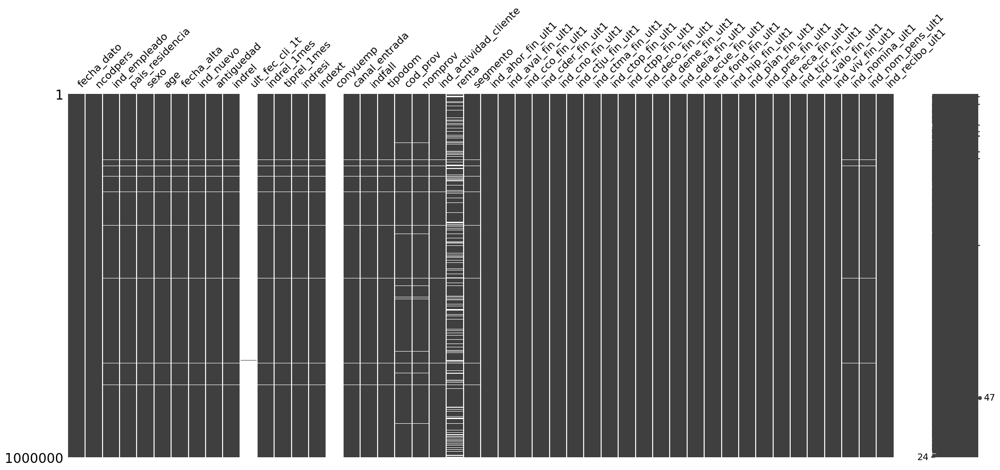

In [7]:
import missingno as msno

msno.matrix(df)
plt.show()

In [8]:
# Deleting columns ult_fec_cli_1t and conyuemp due to too many missing values
# Will deal with renta later

df = df.drop('ult_fec_cli_1t', axis=1)
df = df.drop('conyuemp', axis=1)

# Dropping tipodom since every column has the same value
df = df.drop('tipodom', axis=1)

In [9]:
missing = ['fecha_dato', 'ncodpers', 'ind_empleado', 'pais_residencia', 'sexo',
           'age', 'fecha_alta', 'ind_nuevo', 'antiguedad', 'indrel',
           'indrel_1mes', 'tiprel_1mes', 'indresi', 'indext',
           'canal_entrada', 'indfall', 'cod_prov',
           'nomprov', 'ind_actividad_cliente', 'segmento']

df = df.dropna(subset=missing)
df = df.dropna(subset=['ind_nomina_ult1','ind_nom_pens_ult1'])

In [10]:
missing_data=df.isnull().sum()
print("Missing data:\n", missing_data)

Missing data:
 fecha_dato                    0
ncodpers                      0
ind_empleado                  0
pais_residencia               0
sexo                          0
age                           0
fecha_alta                    0
ind_nuevo                     0
antiguedad                    0
indrel                        0
indrel_1mes                   0
tiprel_1mes                   0
indresi                       0
indext                        0
canal_entrada                 0
indfall                       0
cod_prov                      0
nomprov                       0
ind_actividad_cliente         0
renta                    157379
segmento                      0
ind_ahor_fin_ult1             0
ind_aval_fin_ult1             0
ind_cco_fin_ult1              0
ind_cder_fin_ult1             0
ind_cno_fin_ult1              0
ind_ctju_fin_ult1             0
ind_ctma_fin_ult1             0
ind_ctop_fin_ult1             0
ind_ctpp_fin_ult1             0
ind_deco_fin_ult1        

In [11]:
# RENTA dropping
median_renta = df['renta'].median()

df['renta'].fillna(median_renta, inplace=True)

In [12]:
# INVALID ENTRIES

indep = ['fecha_dato', 'ind_empleado', 'pais_residencia', 'sexo',
       'age', 'fecha_alta', 'ind_nuevo', 'antiguedad', 'indrel', 'indrel_1mes',
       'tiprel_1mes', 'indresi', 'indext', 'canal_entrada', 'indfall',
       'cod_prov', 'nomprov', 'ind_actividad_cliente', 'renta',
       'segmento']

df[indep].describe()

,fecha_dato,age,fecha_alta,ind_nuevo,antiguedad,indrel,indrel_1mes,cod_prov,ind_actividad_cliente,renta
count,982056,982056.000000,982056,982056.000000,982056.000000,982056.000000,982056.000000,982056.000000,982056.000000,9.820560e+05
mean,2015-02-08 14:18:32.666487296,43.235307,2007-04-30 06:57:40.377819904,0.000388,92.821855,1.104780,1.000004,26.851765,0.564784,1.343562e+05
min,2015-01-28 00:00:00,2.000000,1995-01-16 00:00:00,0.000000,-999999.000000,1.000000,1.000000,1.000000,0.000000,1.202730e+03
25%,2015-01-28 00:00:00,27.000000,2002-05-02 00:00:00,0.000000,33.000000,1.000000,1.000000,18.000000,0.000000,7.768174e+04
50%,2015-01-28 00:00:00,43.000000,2007-03-21 00:00:00,0.000000,96.000000,1.000000,1.000000,28.000000,1.000000,1.066504e+05
75%,2015-02-28 00:00:00,53.000000,2012-10-16 00:00:00,0.000000,157.000000,1.000000,1.000000,33.000000,1.000000,1.488537e+05
max,2015-02-28 00:00:00,116.000000,2015-02-27 00:00:00,1.000000,246.000000,99.000000,3.000000,52.000000,1.000000,2.889440e+07
std,NaN,17.181722,NaN,0.019693,2019.454637,3.202731,0.002854,12.423476,0.495785,2.193464e+05


In [13]:
for col in ['age', 'antiguedad', 'renta']:
    lower_limit = df[col].quantile(0.05)
    upper_limit = df[col].quantile(0.95)

    df = df[(df[col] >= lower_limit) & (df[col] <= upper_limit)]

In [14]:
# CHECK FOR DUPLICATES (DROPPED ID COLUMN)

df = df.drop('ncodpers', axis=1)

duplicates=df.duplicated().sum()
print("Number of Duplicate Records: ", duplicates)

Number of Duplicate Records:  8678


In [15]:
df=df.drop_duplicates()

In [16]:
duplicates=df.duplicated().sum()
print("Number of Duplicate Records: ", duplicates)

Number of Duplicate Records:  0


In [17]:
# OUTLIER DETECTION

indep_n = ['age', 'antiguedad', 'renta']

for col in indep_n:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)

    IQR_15 = (Q3 - Q1) * 1.5

    low = Q1 - IQR_15 
    high = Q3 + IQR_15 

    if df.loc[df[col]<low, col].any() or df.loc[df[col]>high, col].any():
        a = True
    else:
        a = False

    print(f"{col} outlier detection: {a}")

age outlier detection: False
antiguedad outlier detection: False
renta outlier detection: True


In [18]:
Q1 = df['renta'].quantile(0.25)
Q3 = df['renta'].quantile(0.75)

IQR_15 = (Q3 - Q1) * 1.5

low = Q1 - IQR_15 
high = Q3 + IQR_15 

median = df['renta'].median()

df.loc[df['renta']>high, col] = Q3

## Data Visualization

In [19]:
df.columns

Index(['fecha_dato', 'ind_empleado', 'pais_residencia', 'sexo', 'age',
       'fecha_alta', 'ind_nuevo', 'antiguedad', 'indrel', 'indrel_1mes',
       'tiprel_1mes', 'indresi', 'indext', 'canal_entrada', 'indfall',
       'cod_prov', 'nomprov', 'ind_actividad_cliente', 'renta', 'segmento',
       'ind_ahor_fin_ult1', 'ind_aval_fin_ult1', 'ind_cco_fin_ult1',
       'ind_cder_fin_ult1', 'ind_cno_fin_ult1', 'ind_ctju_fin_ult1',
       'ind_ctma_fin_ult1', 'ind_ctop_fin_ult1', 'ind_ctpp_fin_ult1',
       'ind_deco_fin_ult1', 'ind_deme_fin_ult1', 'ind_dela_fin_ult1',
       'ind_ecue_fin_ult1', 'ind_fond_fin_ult1', 'ind_hip_fin_ult1',
       'ind_plan_fin_ult1', 'ind_pres_fin_ult1', 'ind_reca_fin_ult1',
       'ind_tjcr_fin_ult1', 'ind_valo_fin_ult1', 'ind_viv_fin_ult1',
       'ind_nomina_ult1', 'ind_nom_pens_ult1', 'ind_recibo_ult1'],
      dtype='object')

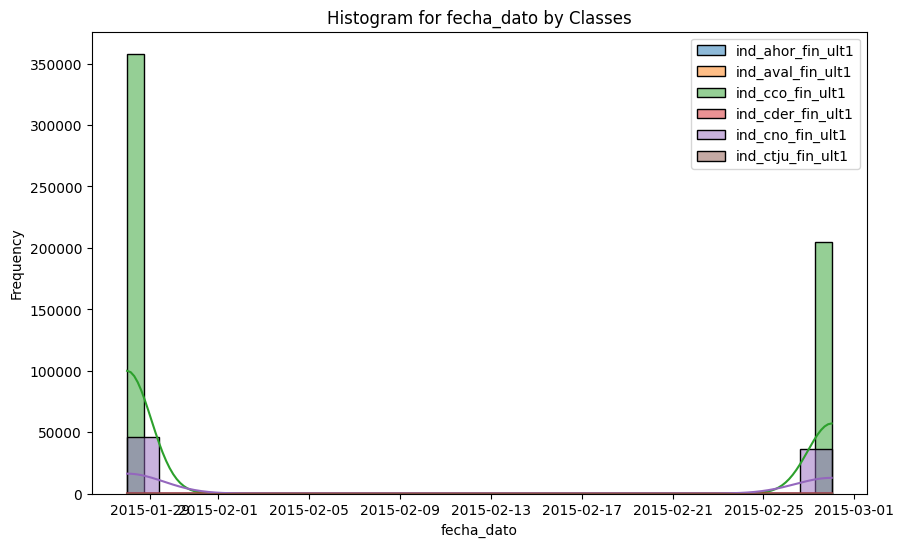

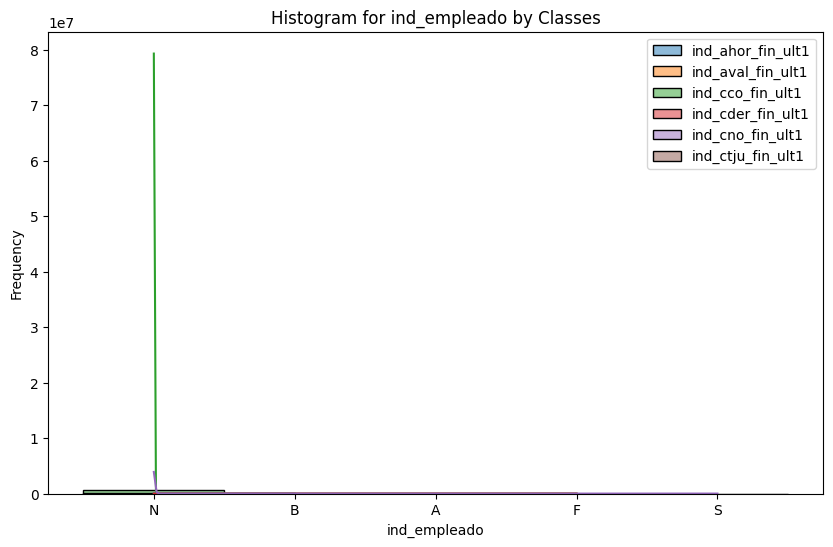

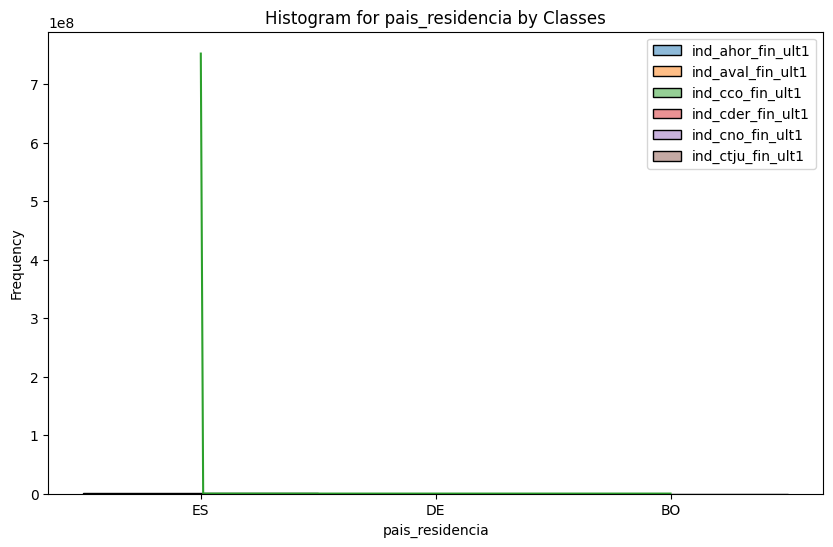

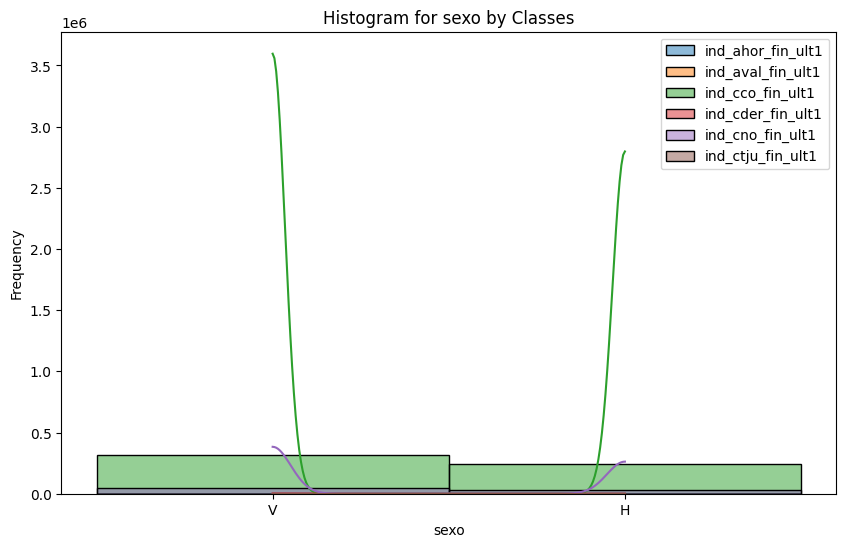

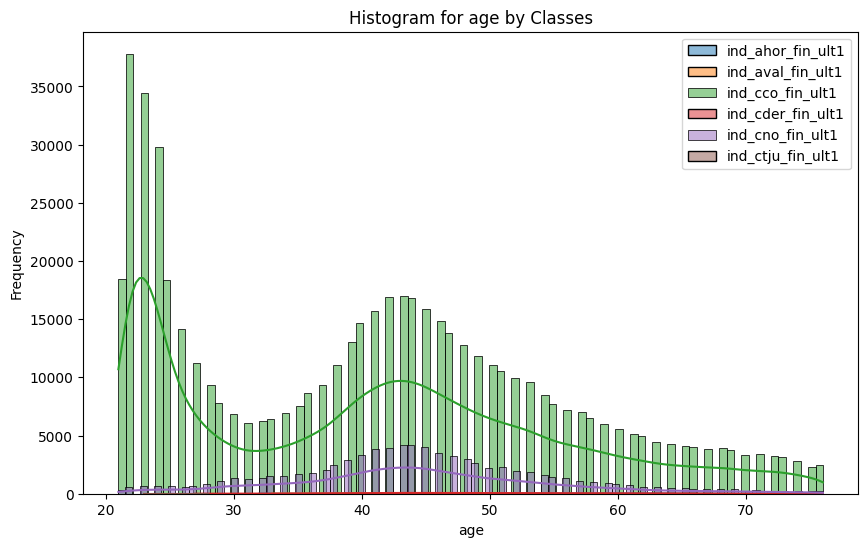

...

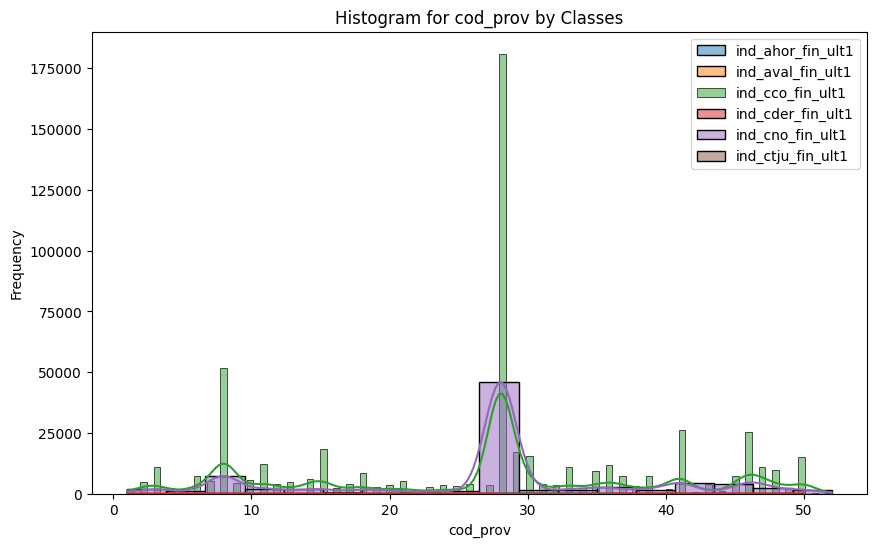

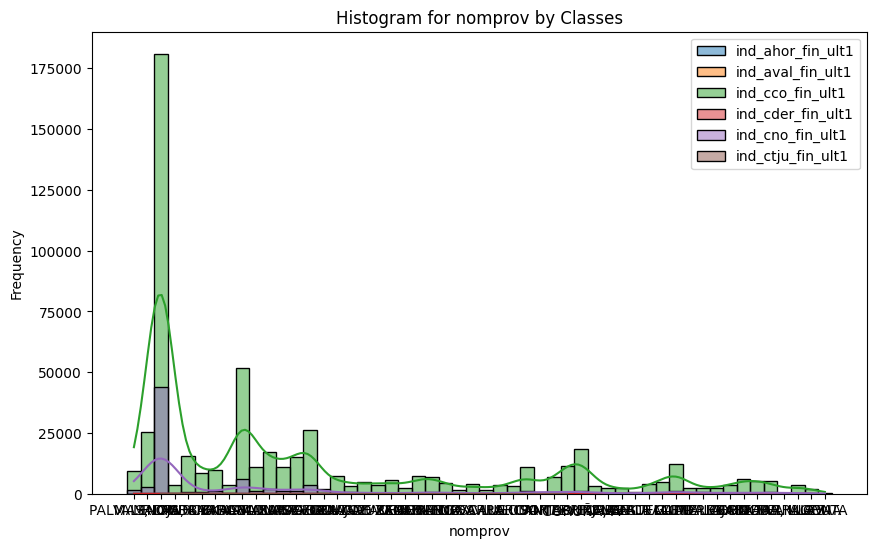

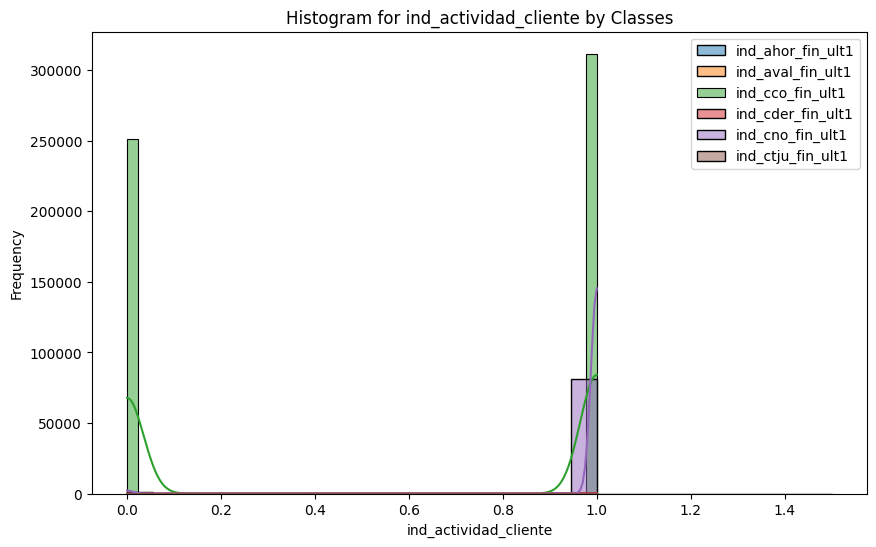

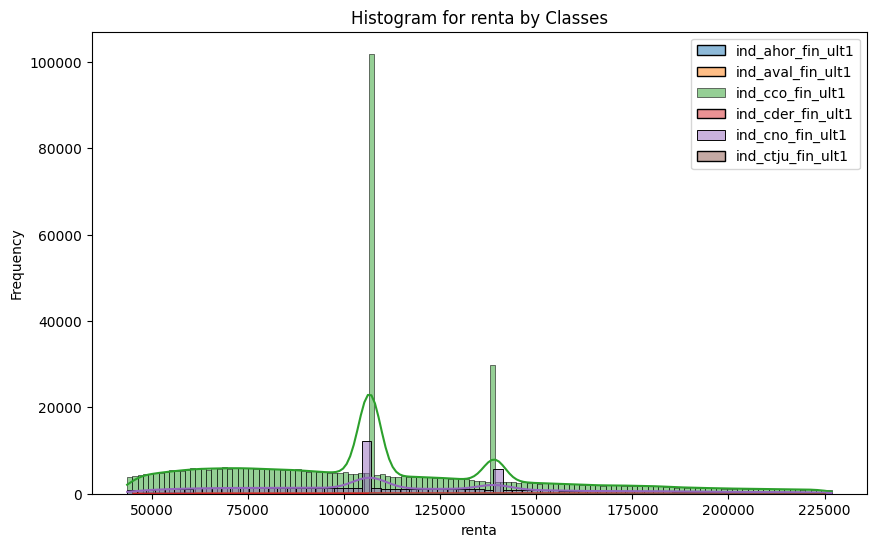

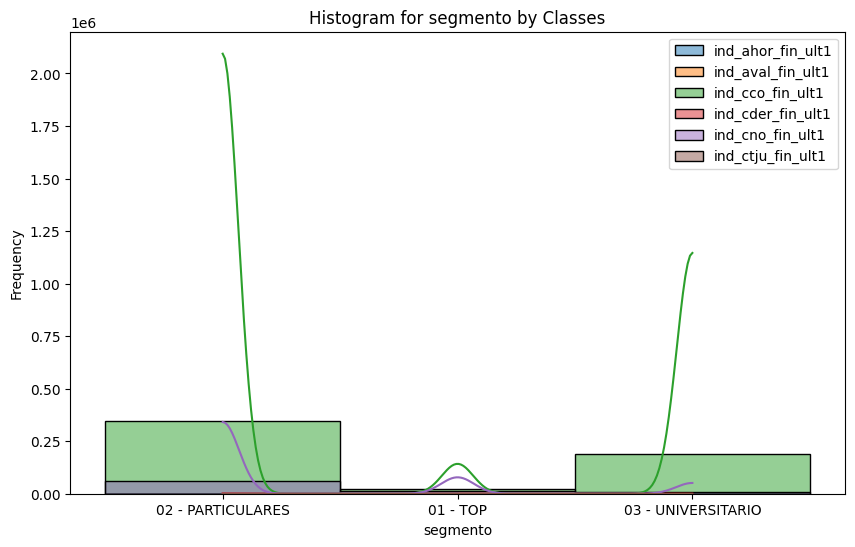

In [20]:
indep = ['fecha_dato', 'ind_empleado', 'pais_residencia', 'sexo', 'age',
       'fecha_alta', 'antiguedad', 'indrel',
       'tiprel_1mes', 'indresi', 'indext', 'canal_entrada', 'indfall',
       'cod_prov', 'nomprov', 'ind_actividad_cliente', 'renta', 'segmento']
target_columns = ['ind_ahor_fin_ult1', 'ind_aval_fin_ult1', 'ind_cco_fin_ult1',
       'ind_cder_fin_ult1', 'ind_cno_fin_ult1', 'ind_ctju_fin_ult1',
       'ind_ctma_fin_ult1', 'ind_ctop_fin_ult1', 'ind_ctpp_fin_ult1',
       'ind_deco_fin_ult1', 'ind_deme_fin_ult1', 'ind_dela_fin_ult1',
       'ind_ecue_fin_ult1', 'ind_fond_fin_ult1', 'ind_hip_fin_ult1',
       'ind_plan_fin_ult1', 'ind_pres_fin_ult1', 'ind_reca_fin_ult1',
       'ind_tjcr_fin_ult1', 'ind_valo_fin_ult1', 'ind_viv_fin_ult1',
       'ind_nomina_ult1', 'ind_nom_pens_ult1', 'ind_recibo_ult1']

# DELETING IND_NUEVO AND INDREL_1MES, there's only 1 unique value in them
df = df.drop('ind_nuevo', axis=1)
df = df.drop('indrel_1mes', axis=1)




# SEPARATING TARGET COLUMNS INTO GROUPS OF 6 TO VIEW

for feature in indep:
    plt.figure(figsize=(10, 6))
    
    # Plot histograms for each class
    for target_column in target_columns[:6]:
        sns.histplot(df[df[target_column] == 1][feature], kde=True, label=f'{target_column}')
    
    plt.title(f'Histogram for {feature} by Classes')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

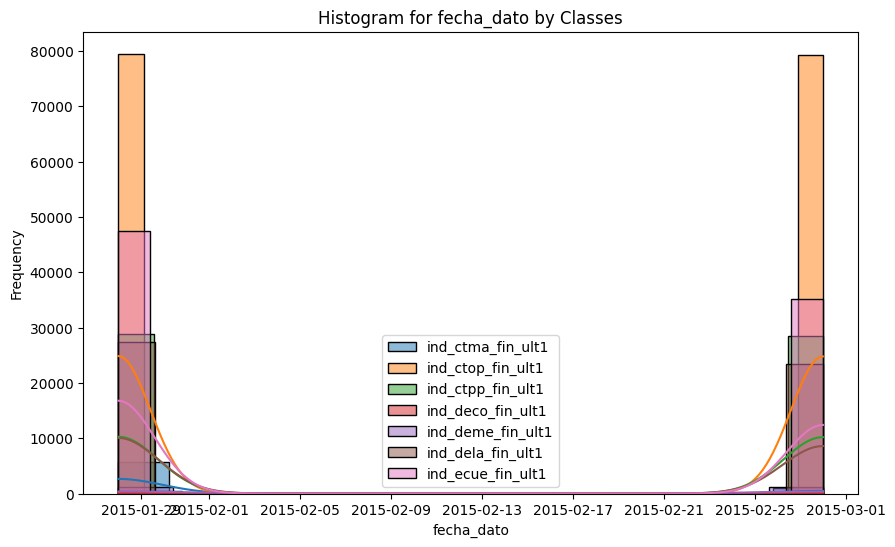

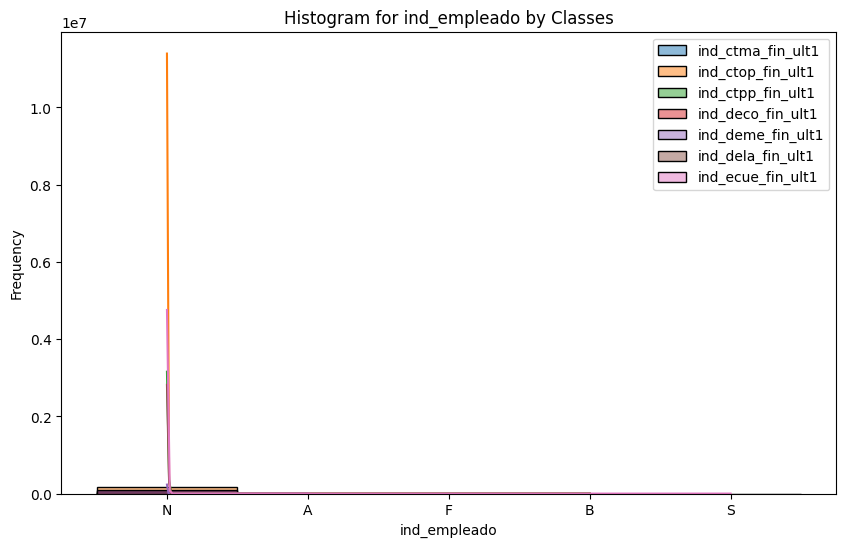

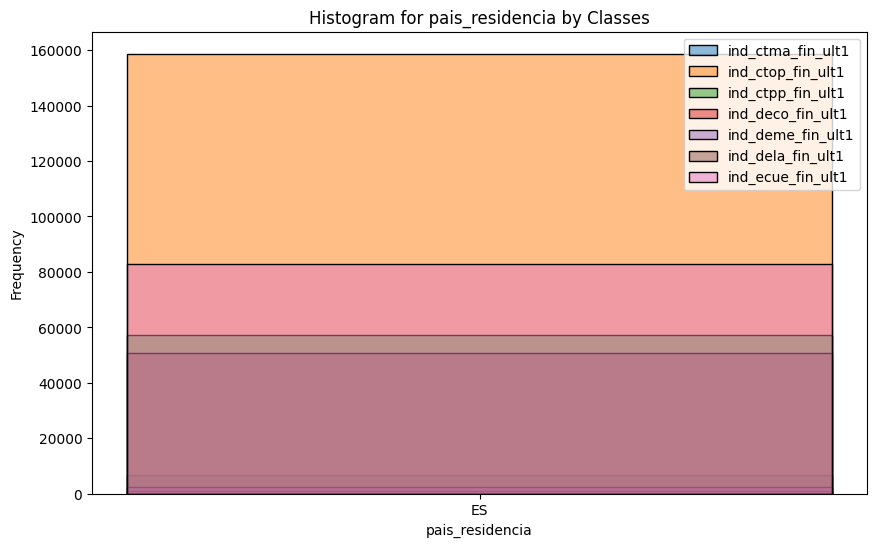

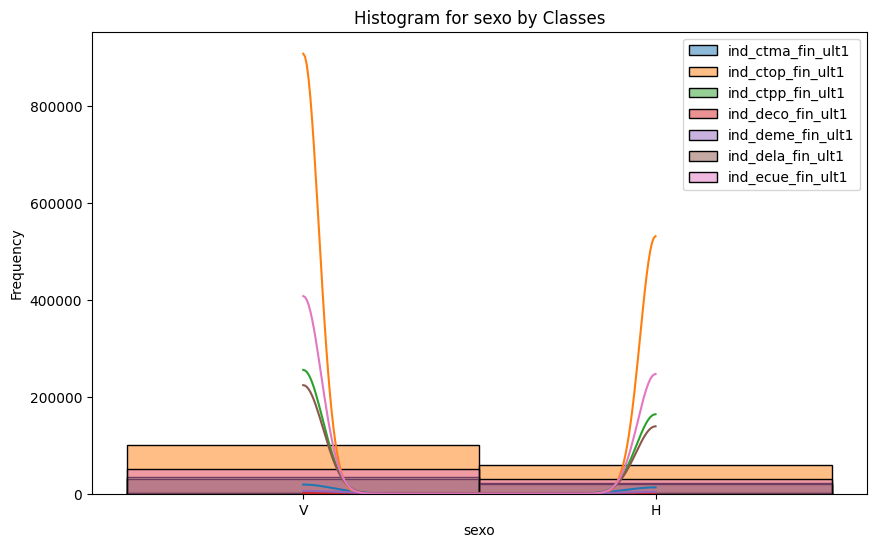

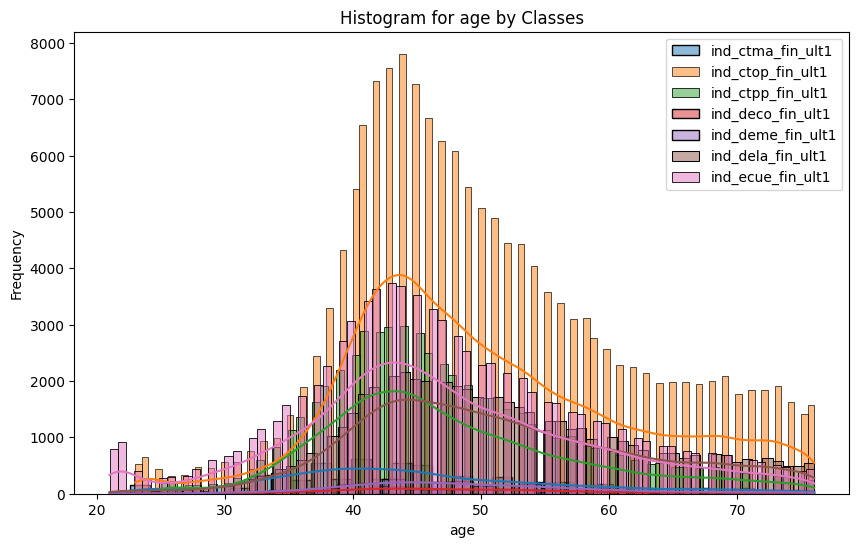

...

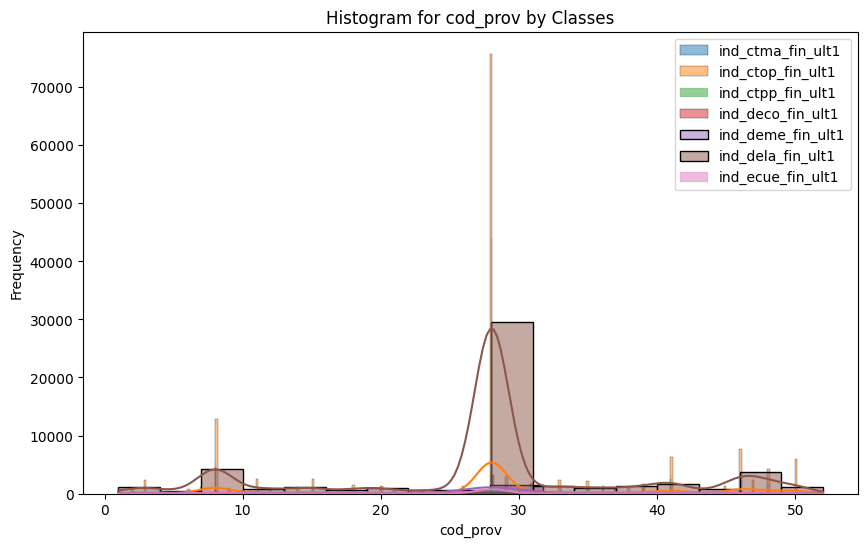

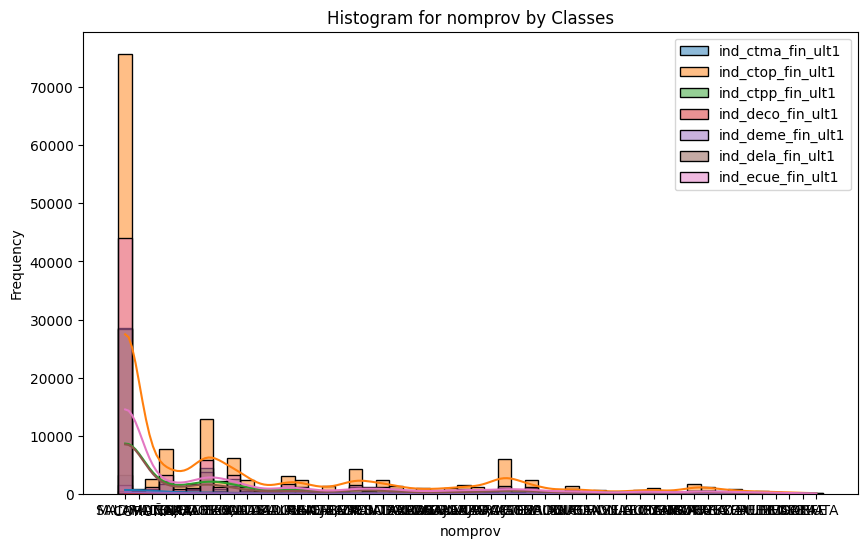

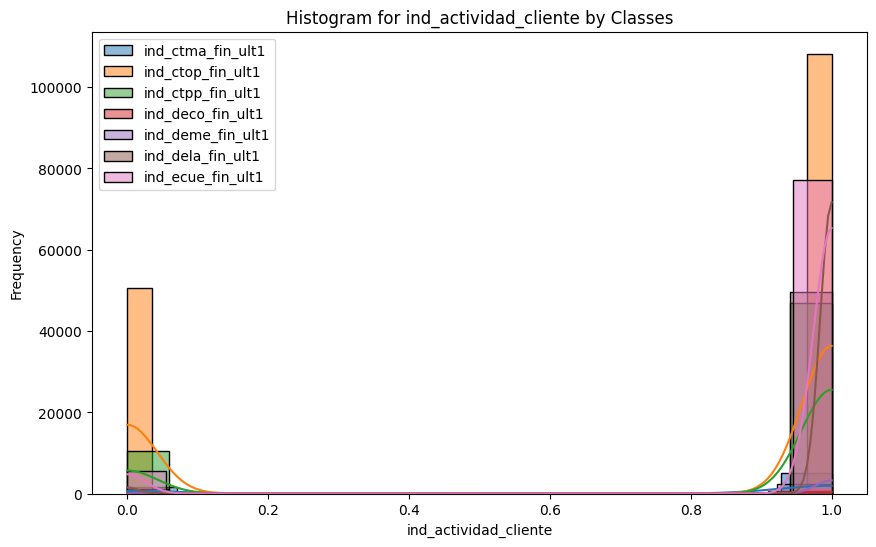

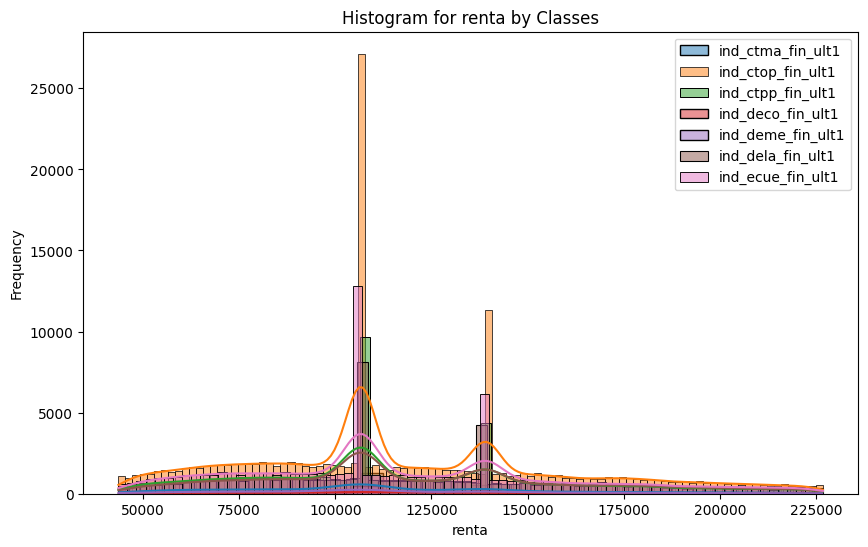

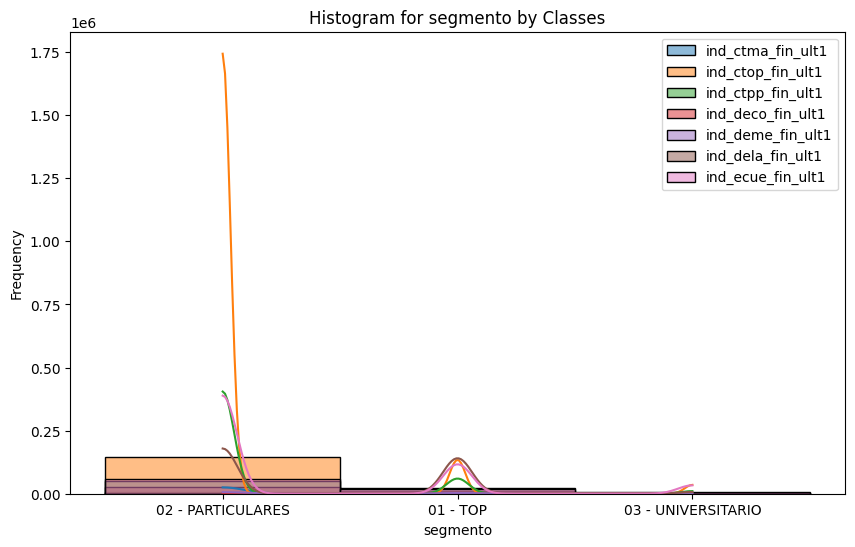

In [21]:
# SEPARATING TARGET COLUMNS INTO GROUPS OF 6 TO VIEW

for feature in indep:
    plt.figure(figsize=(10, 6))
    
    # Plot histograms for each class
    for target_column in target_columns[6:13]:
        sns.histplot(df[df[target_column] == 1][feature], kde=True, label=f'{target_column}')
    
    plt.title(f'Histogram for {feature} by Classes')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

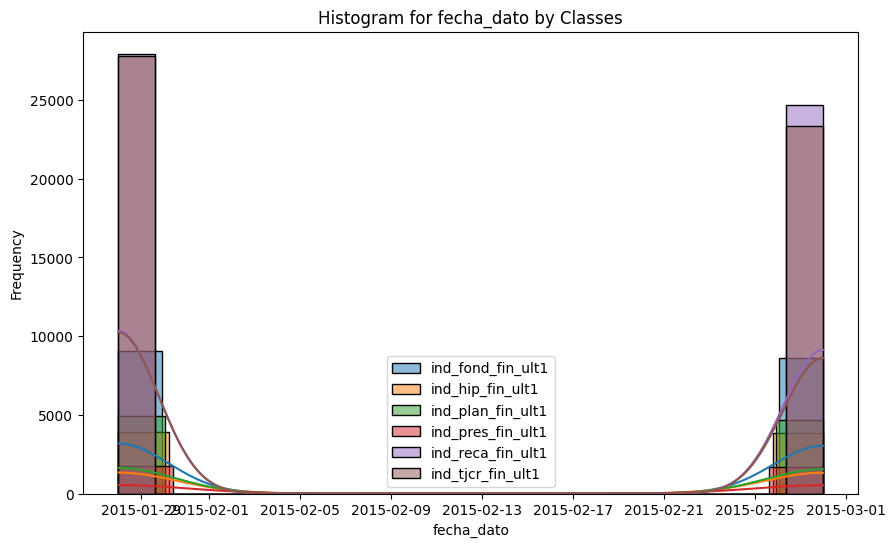

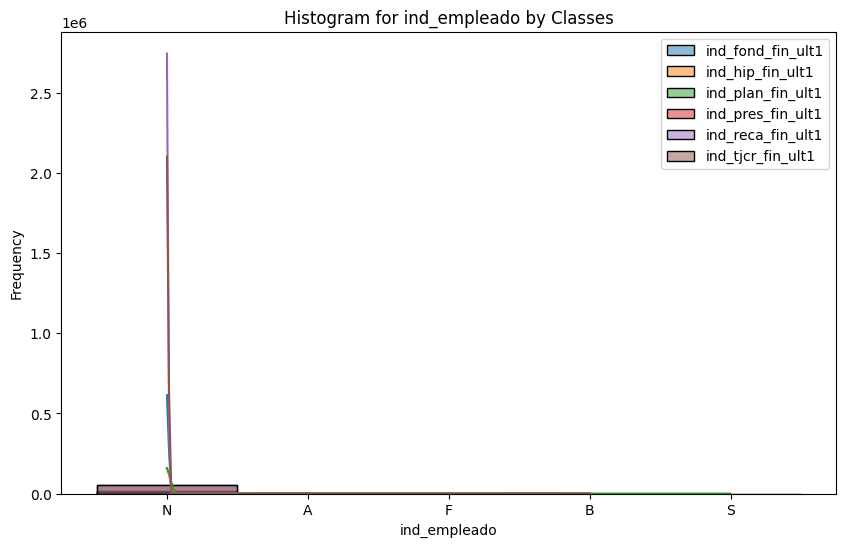

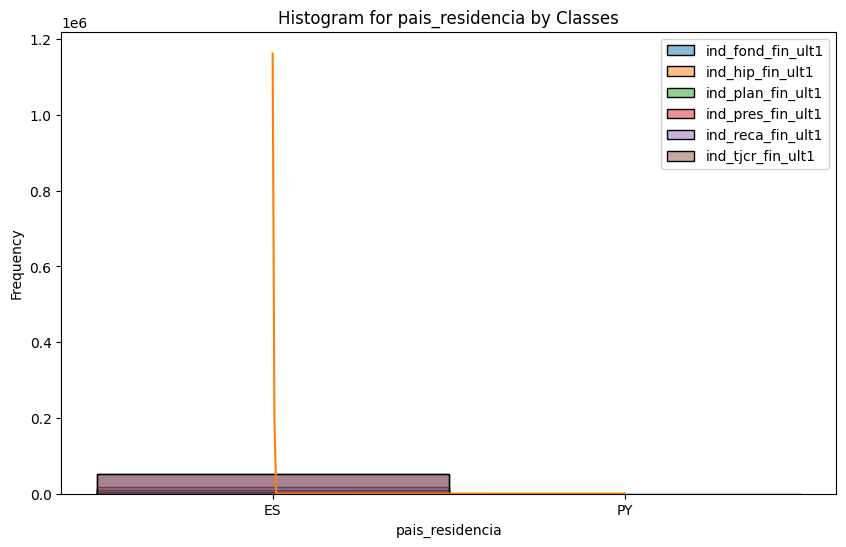

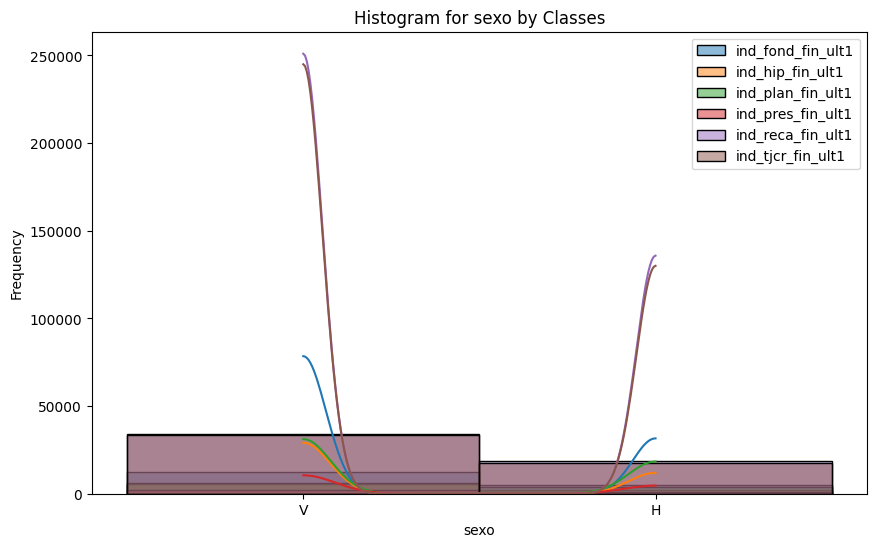

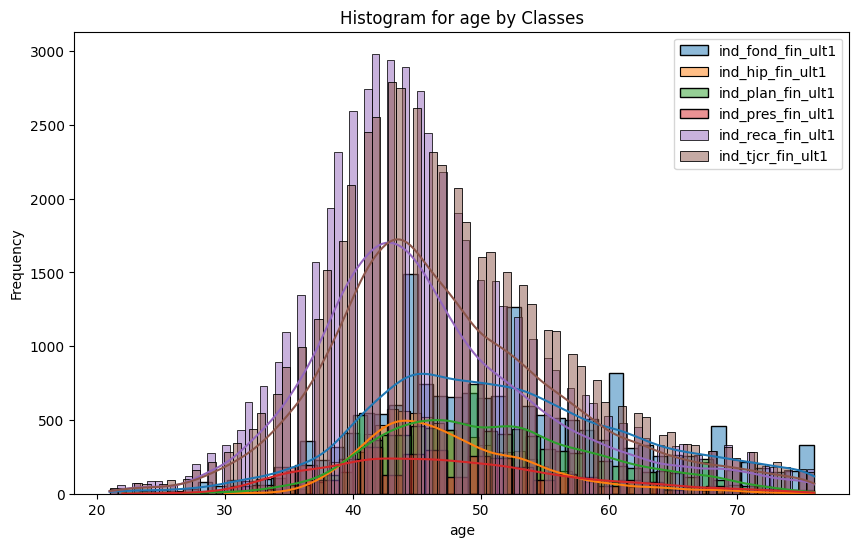

...

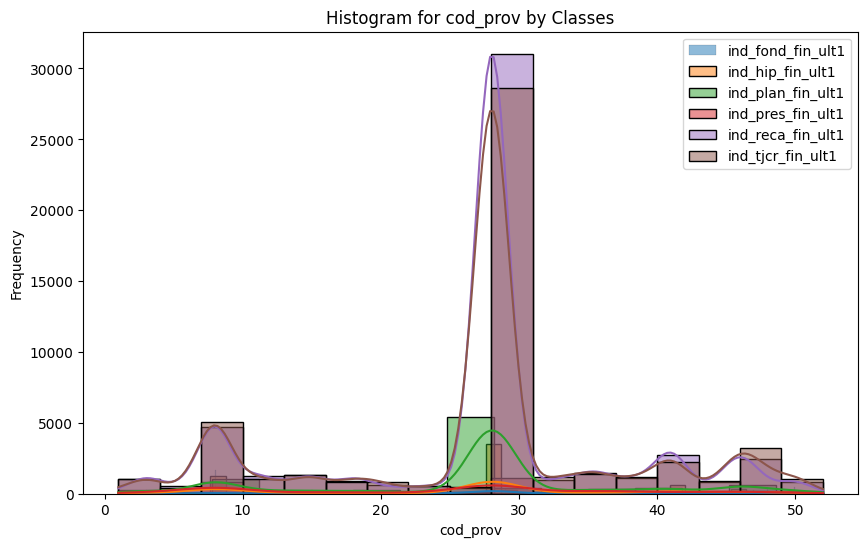

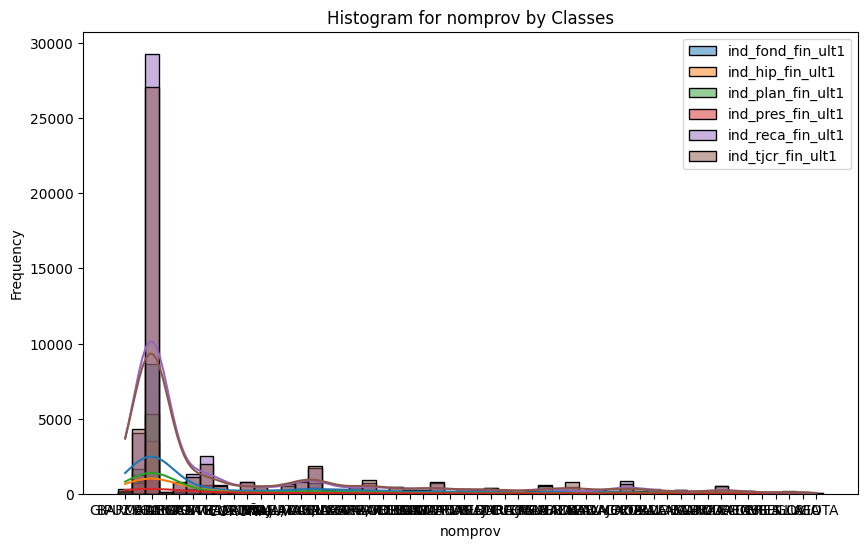

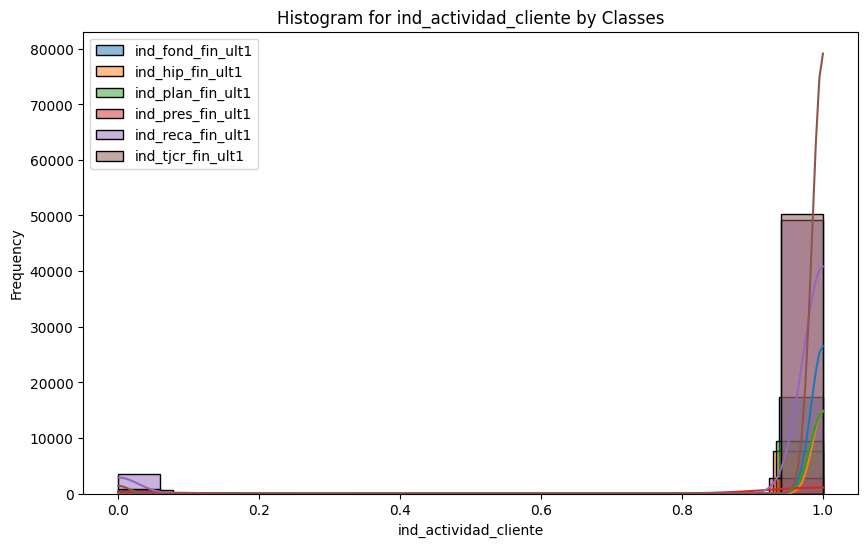

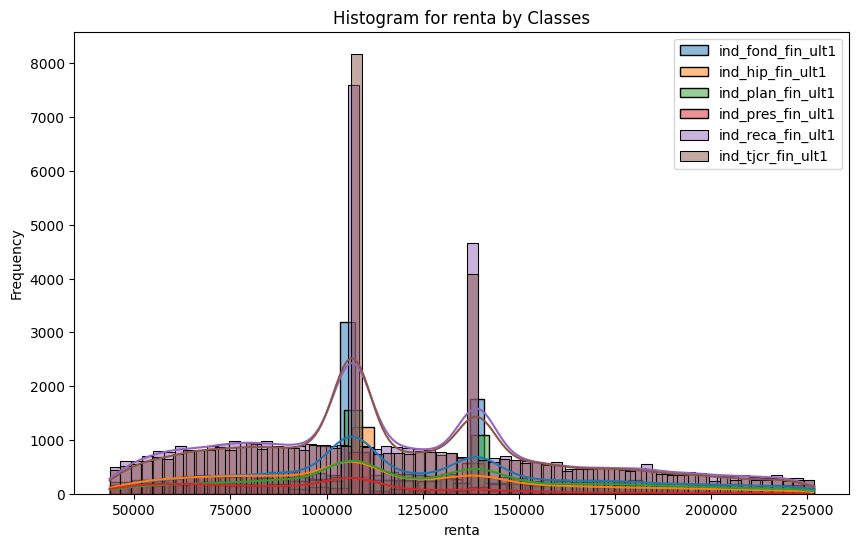

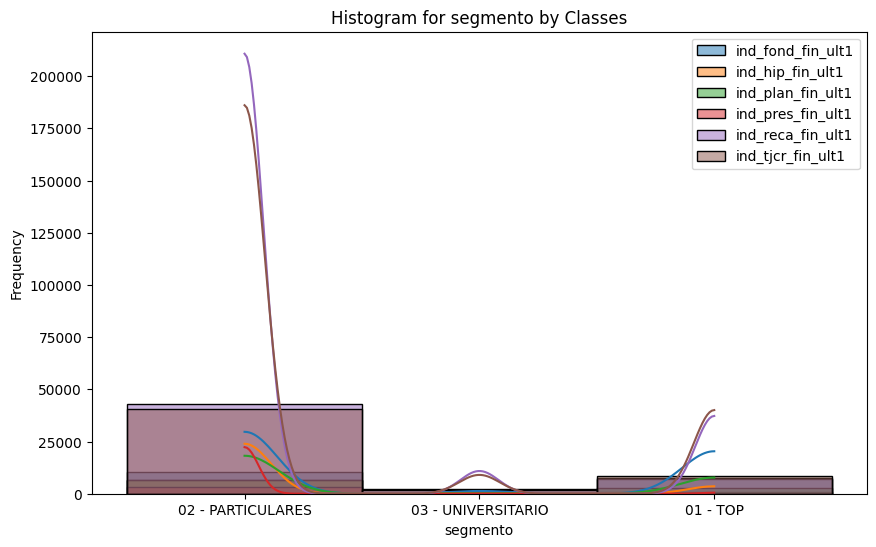

In [22]:
# SEPARATING TARGET COLUMNS INTO GROUPS OF 6 TO VIEW

for feature in indep:
    plt.figure(figsize=(10, 6))
    
    # Plot histograms for each class
    for target_column in target_columns[13:19]:
        sns.histplot(df[df[target_column] == 1][feature], kde=True, label=f'{target_column}')
    
    plt.title(f'Histogram for {feature} by Classes')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

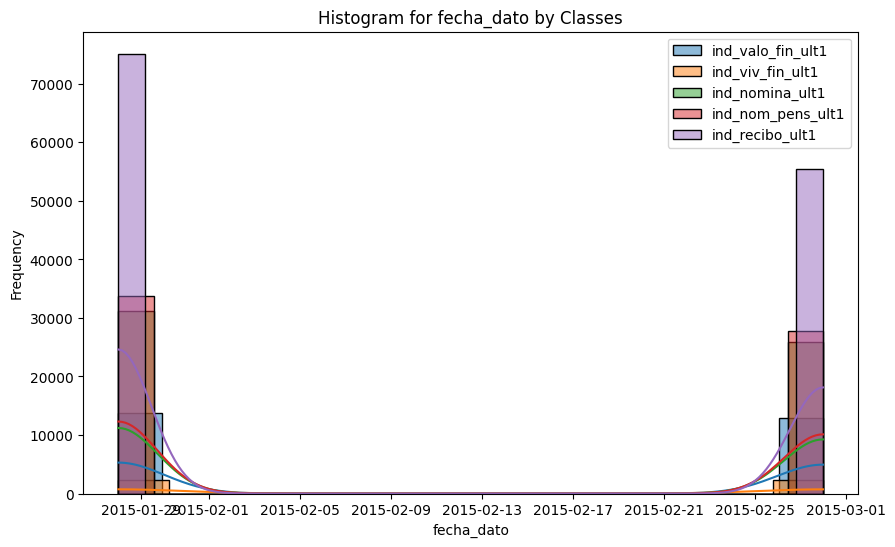

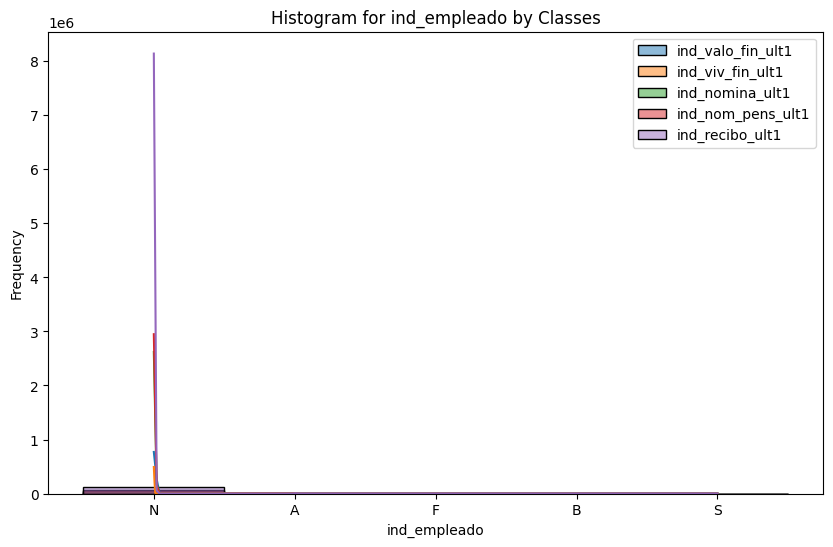

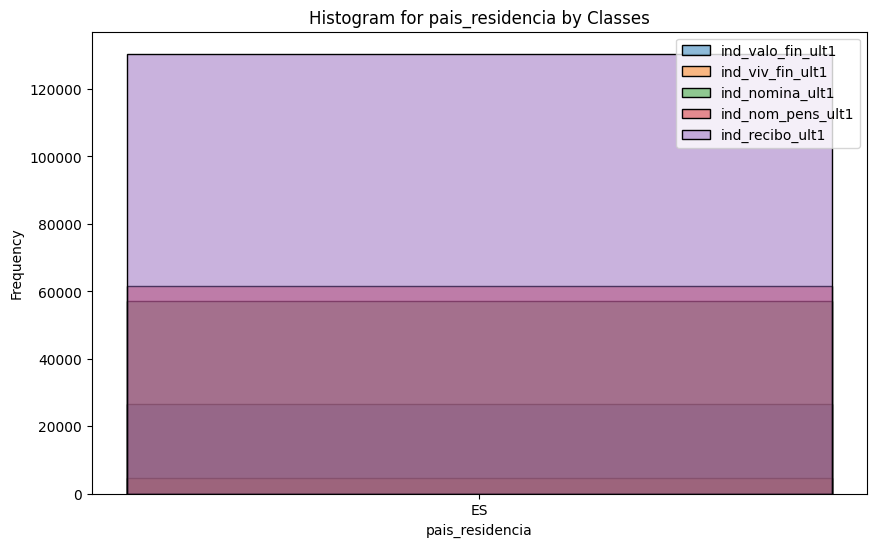

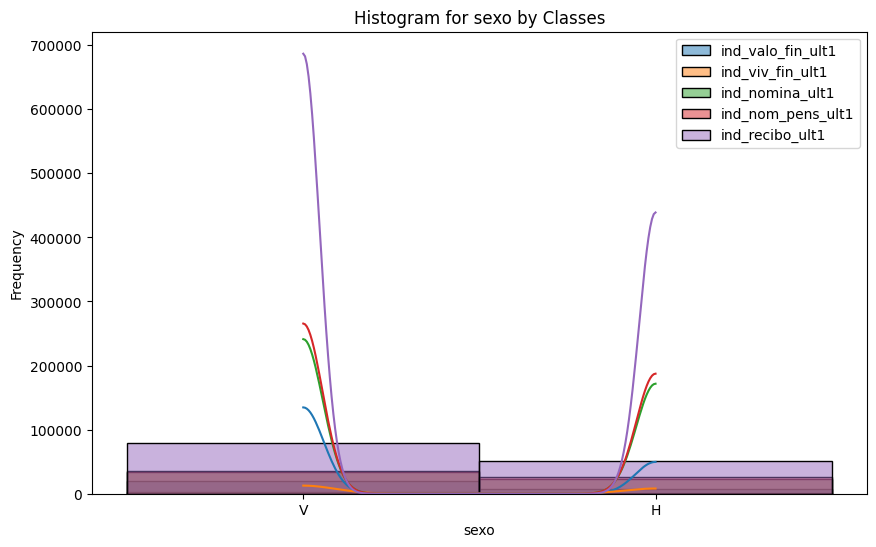

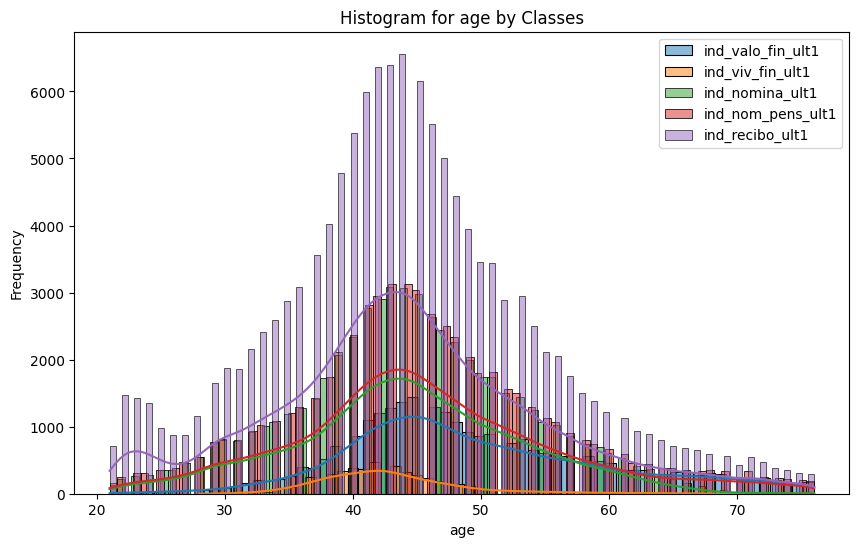

...

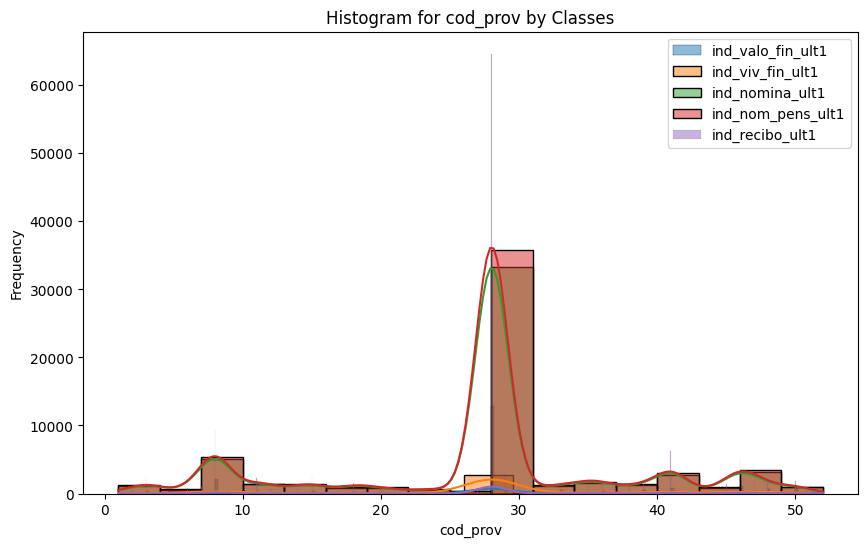

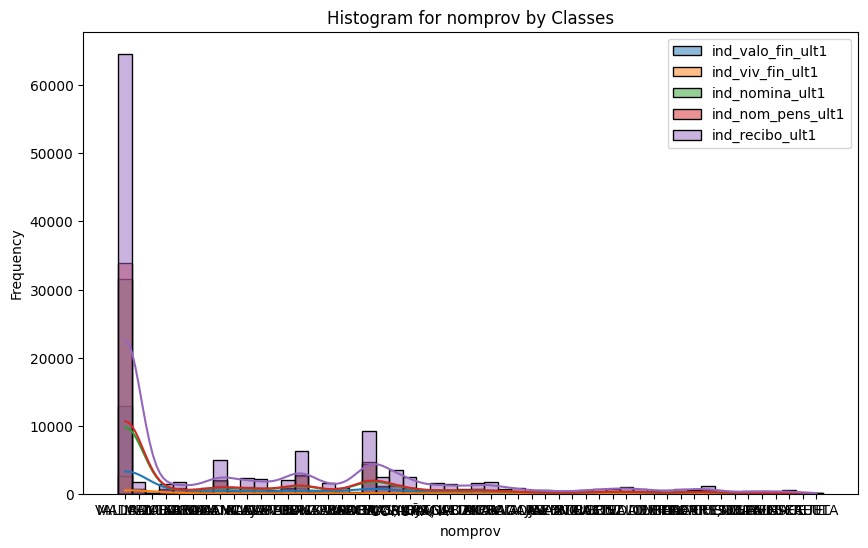

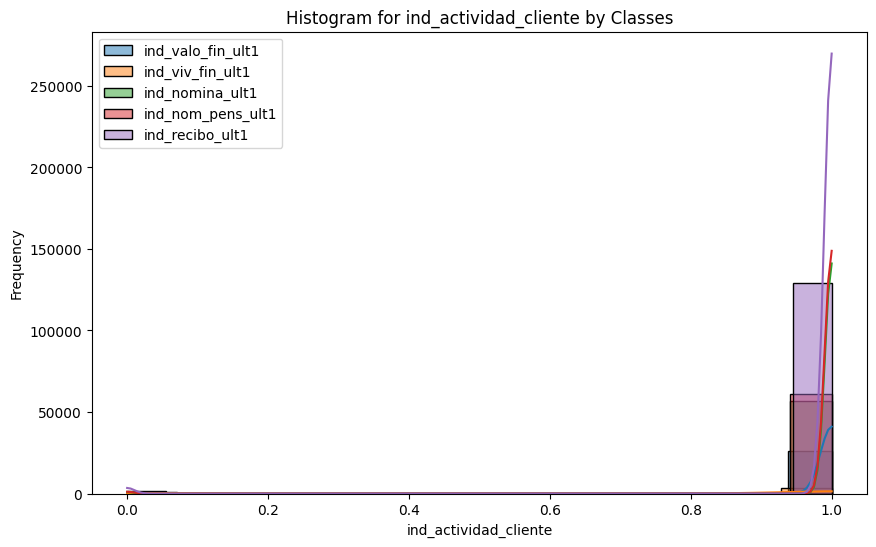

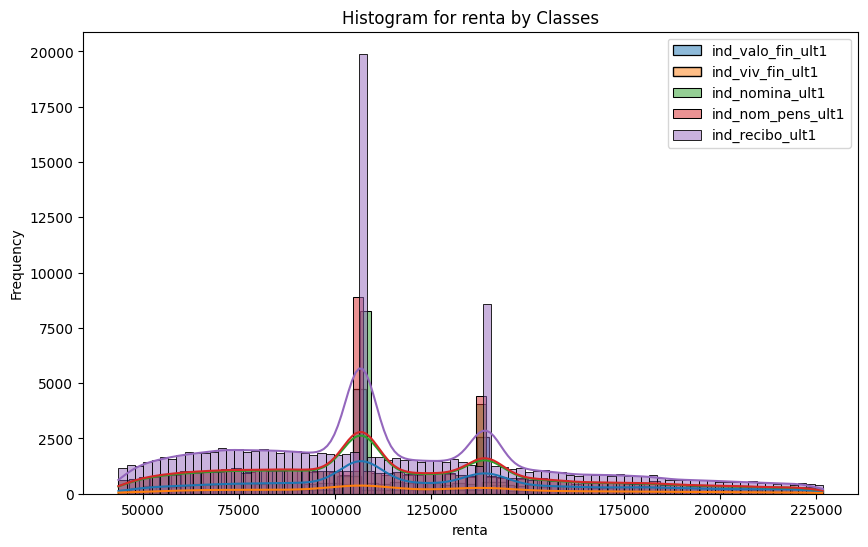

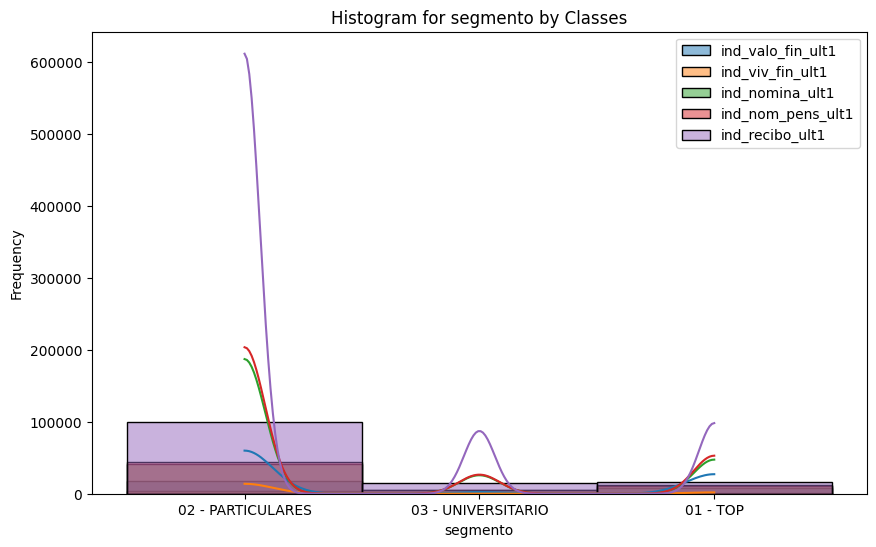

In [23]:
for feature in indep:
    plt.figure(figsize=(10, 6))
    
    # Plot histograms for each class
    for target_column in target_columns[19:25]:
        sns.histplot(df[df[target_column] == 1][feature], kde=True, label=f'{target_column}')
    
    plt.title(f'Histogram for {feature} by Classes')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

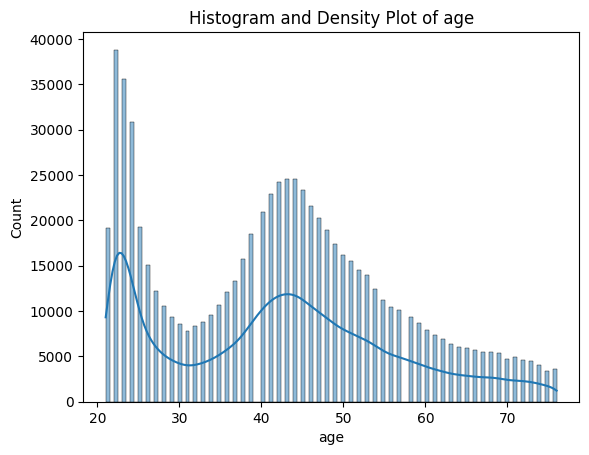

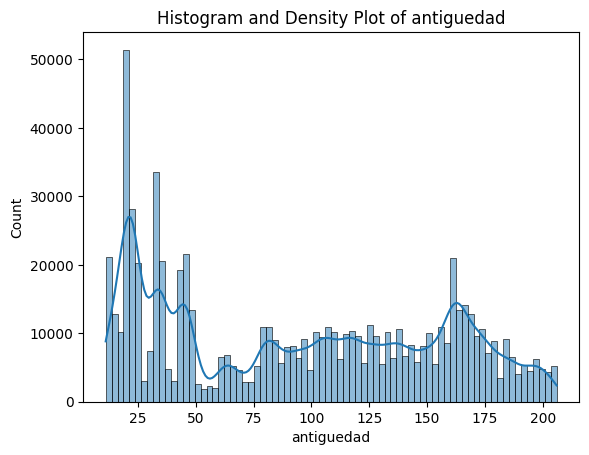

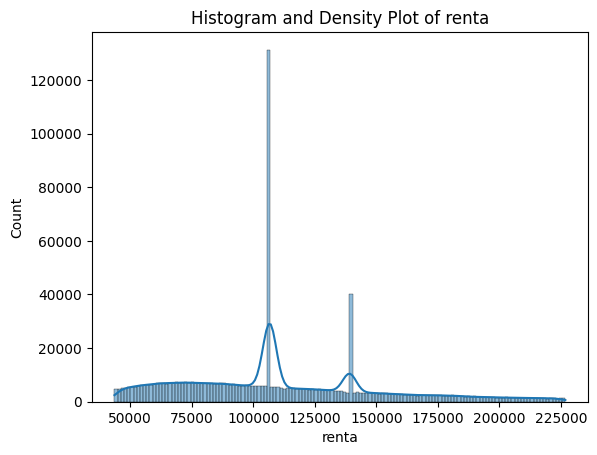

In [24]:
# Looking at frequency of numerical columns

num_columns = ['age', 'antiguedad', 'renta']

for col in num_columns:
    sns.histplot(df[col], kde=True)
    plt.title(f"Histogram and Density Plot of {col}")
    plt.show()

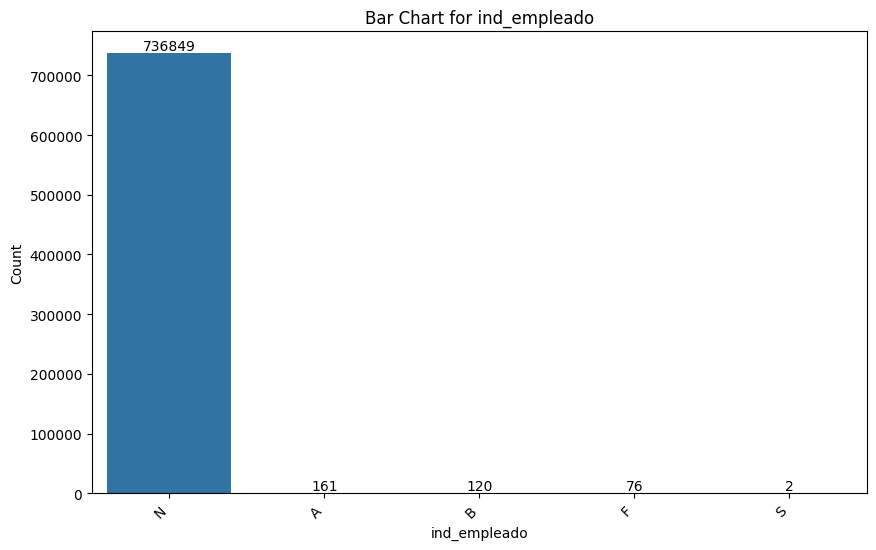

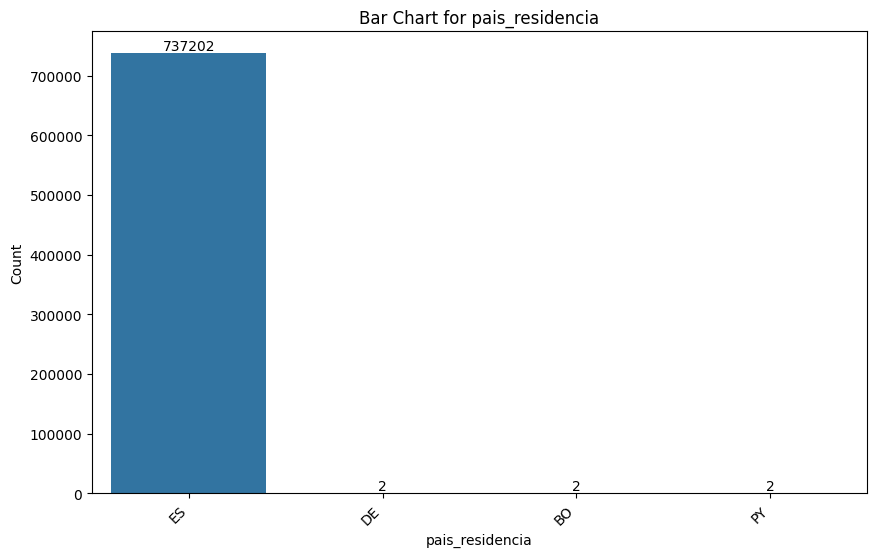

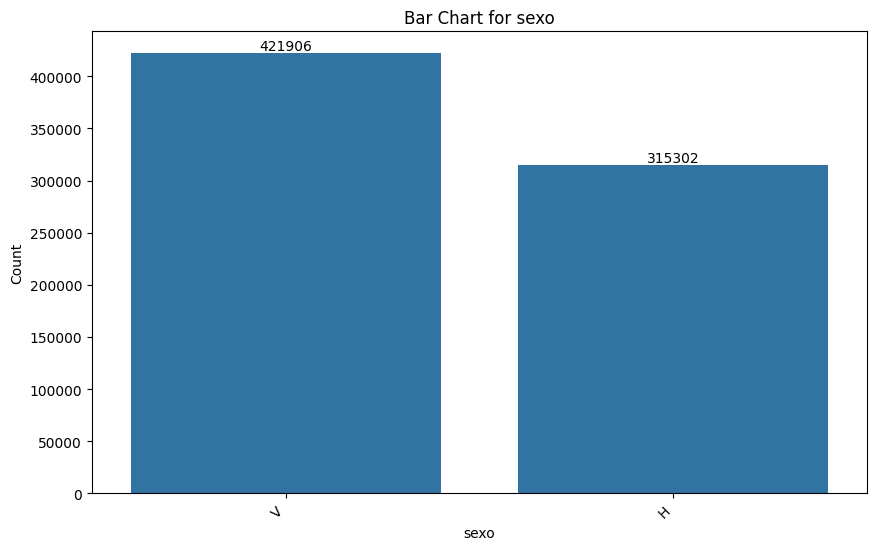

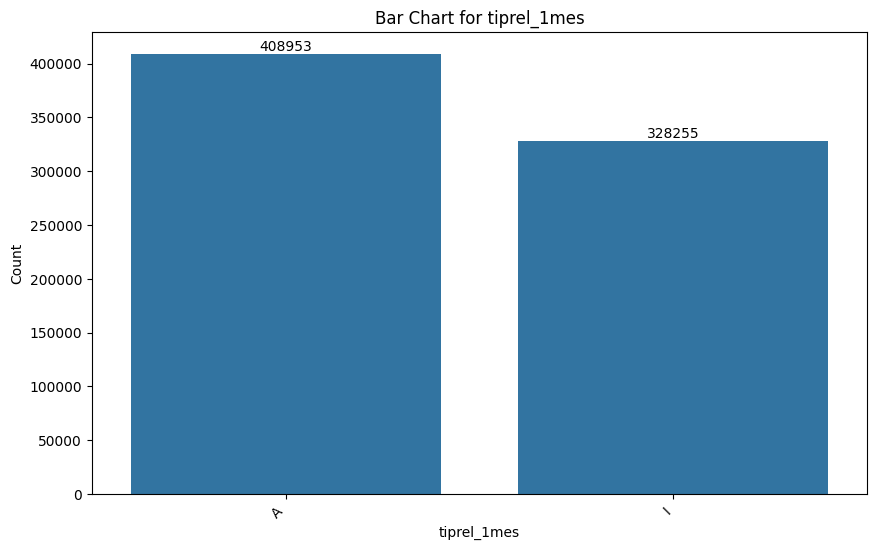

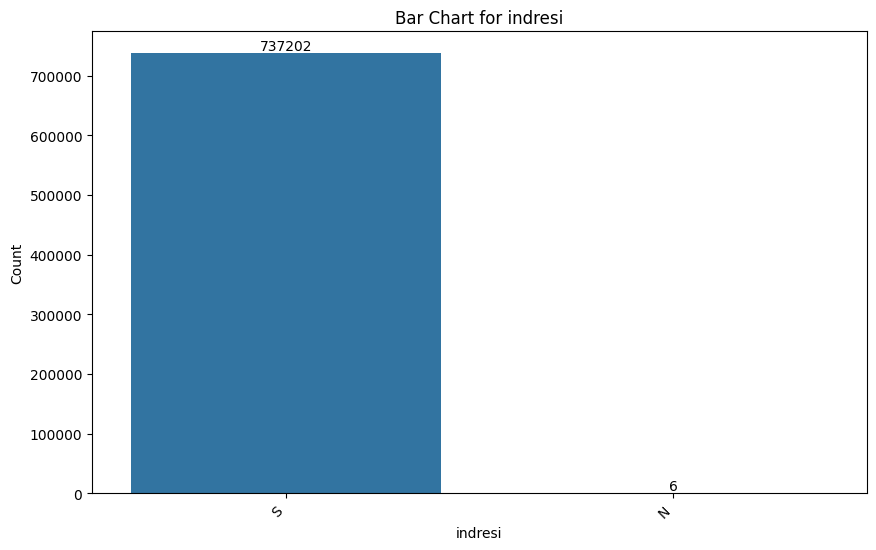

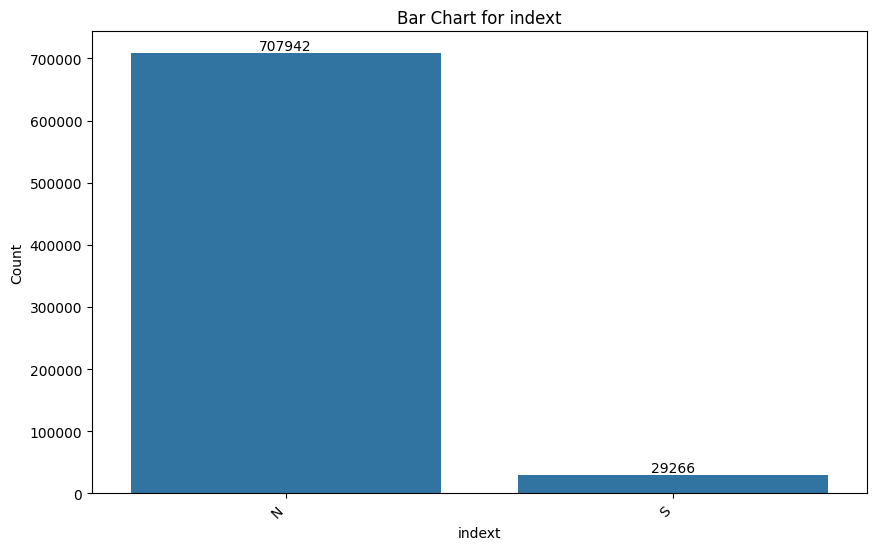

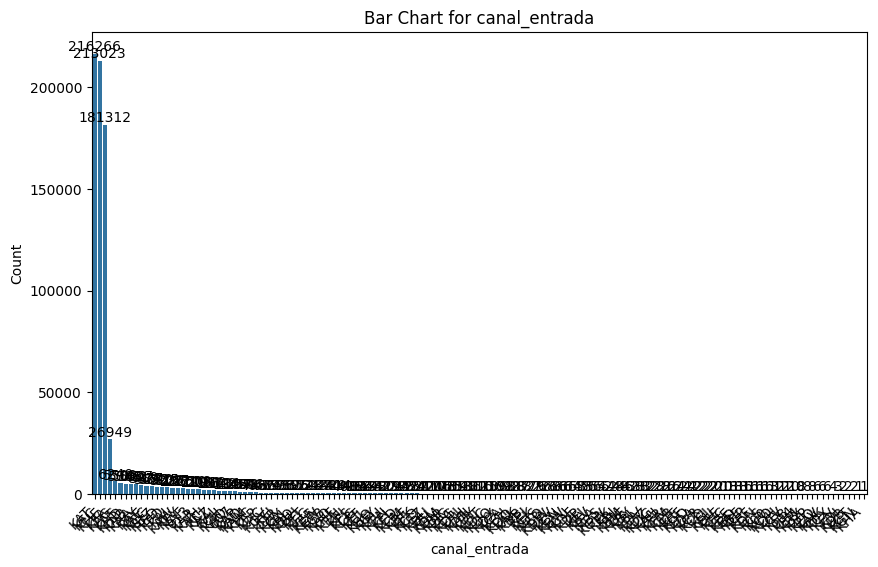

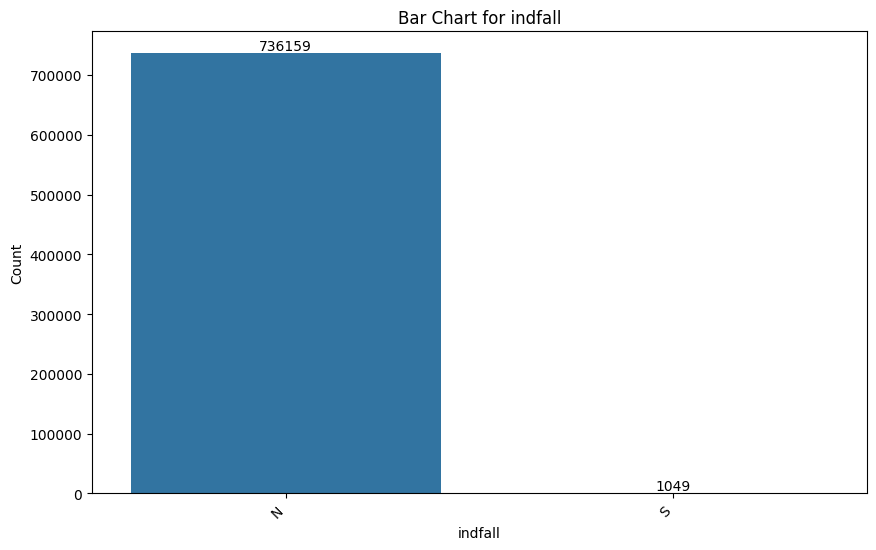

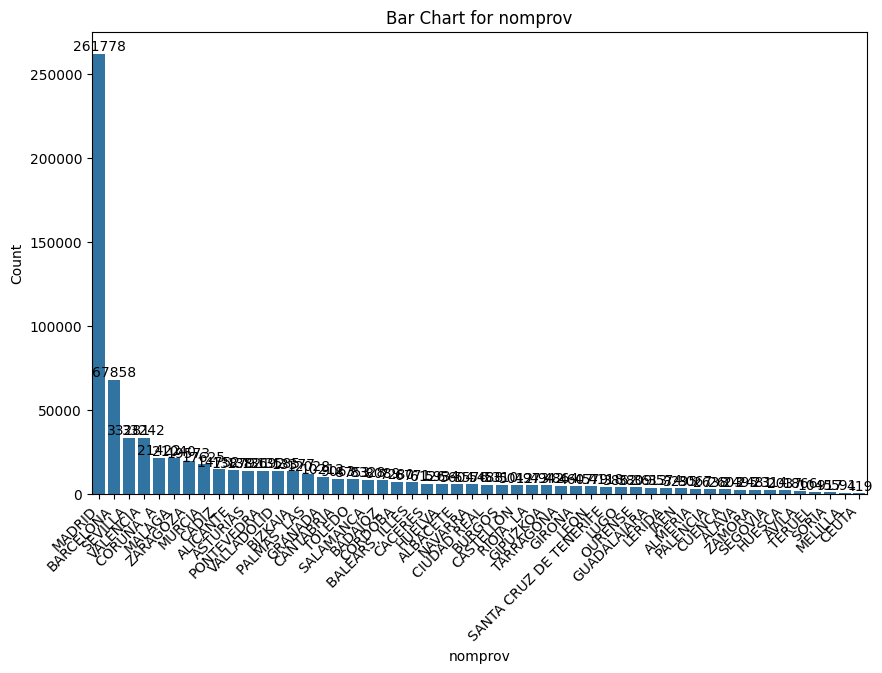

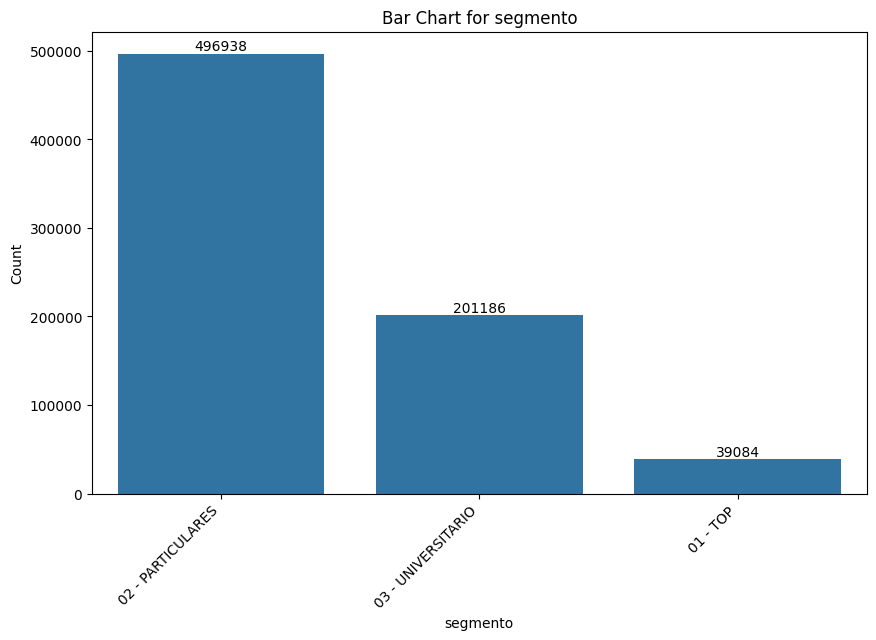

In [25]:
# Looking at frequency of categorical columns

for categorical_column in df.select_dtypes(include='object').columns:

    category_counts = df[categorical_column].value_counts()


    plt.figure(figsize=(10, 6))
    bar_plot = sns.barplot(x=category_counts.index, y=category_counts.values)
    plt.title(f'Bar Chart for {categorical_column}')
    plt.xlabel(categorical_column)
    plt.ylabel('Count')

    # Add text labels on top of the bars
    for index, value in enumerate(category_counts.values):
        plt.text(index, value + 0.1, str(value), ha='center', va='bottom')

    plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
    plt.show()

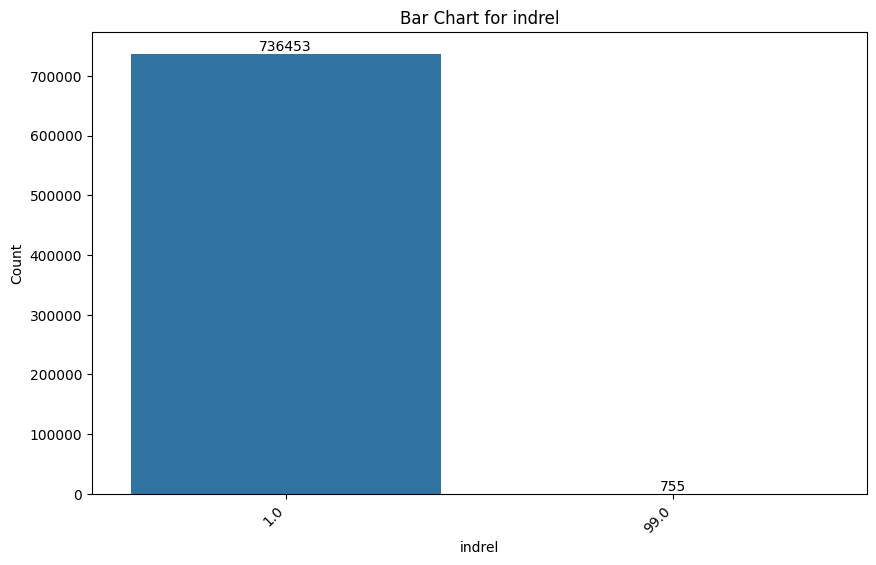

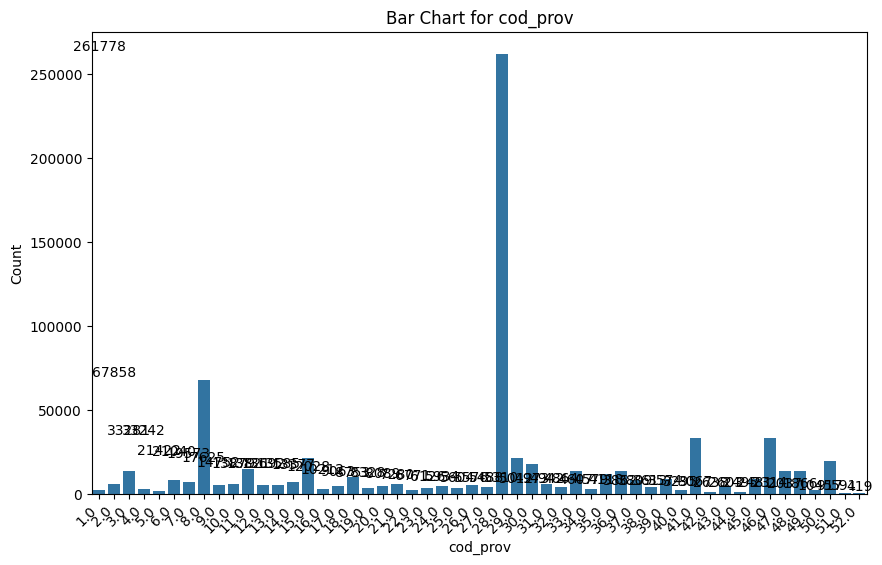

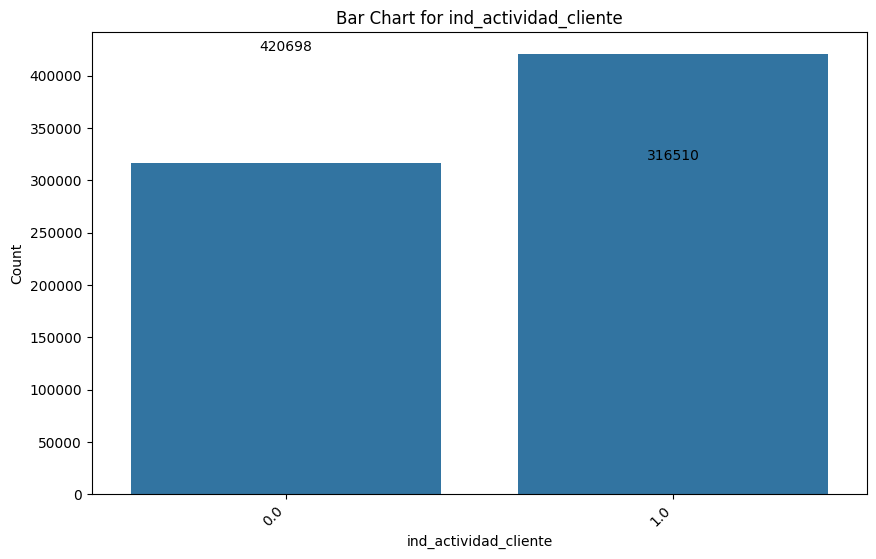

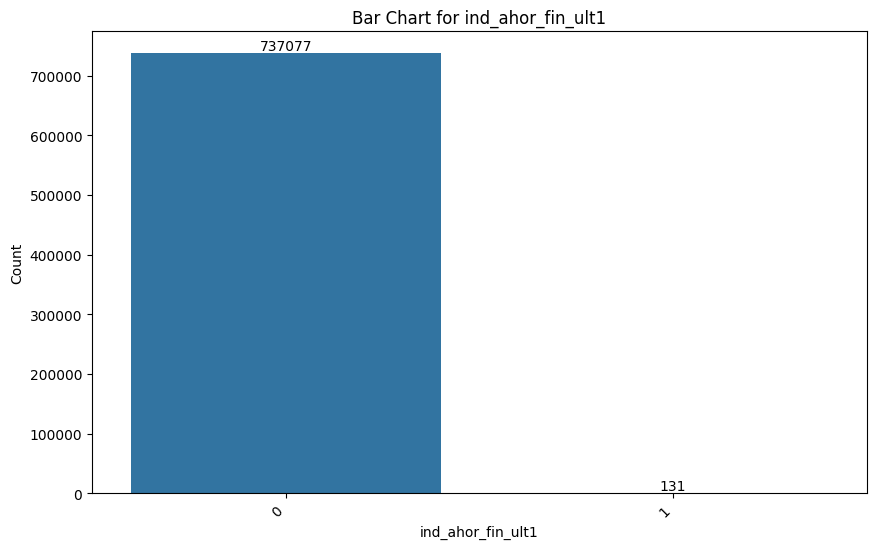

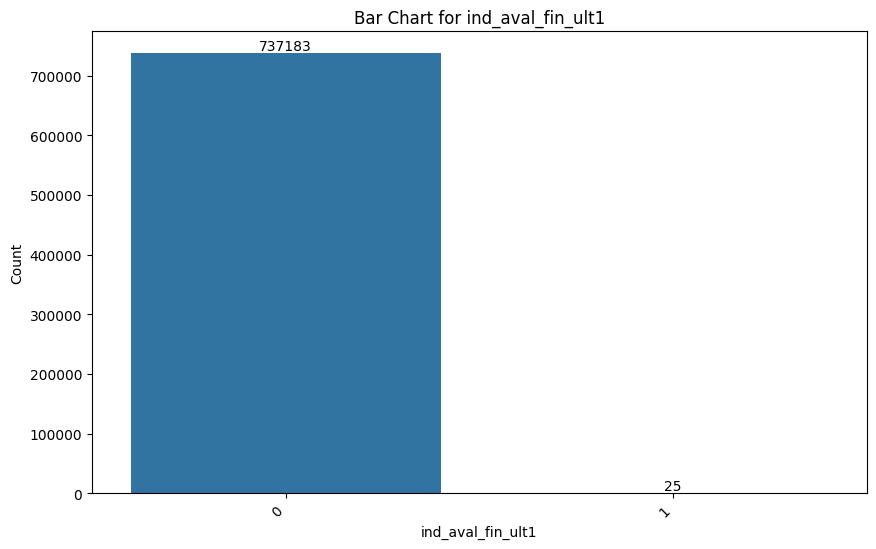

...

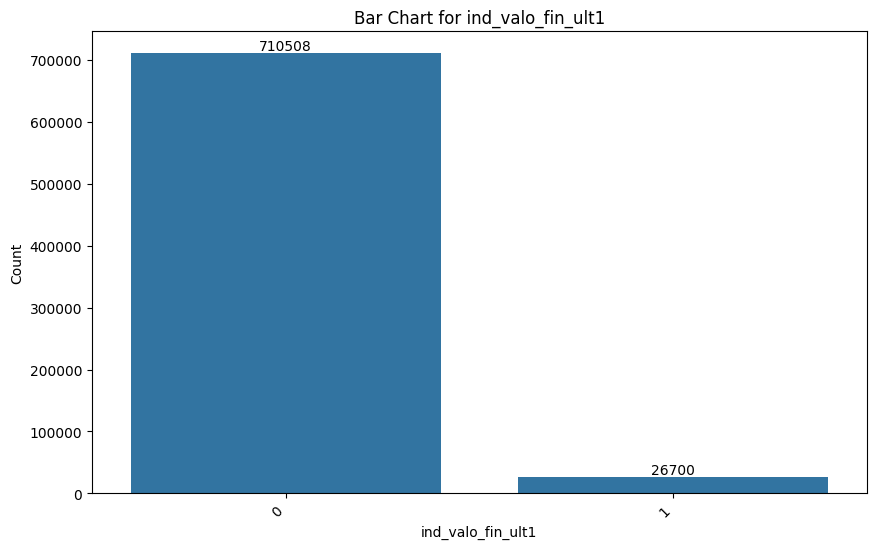

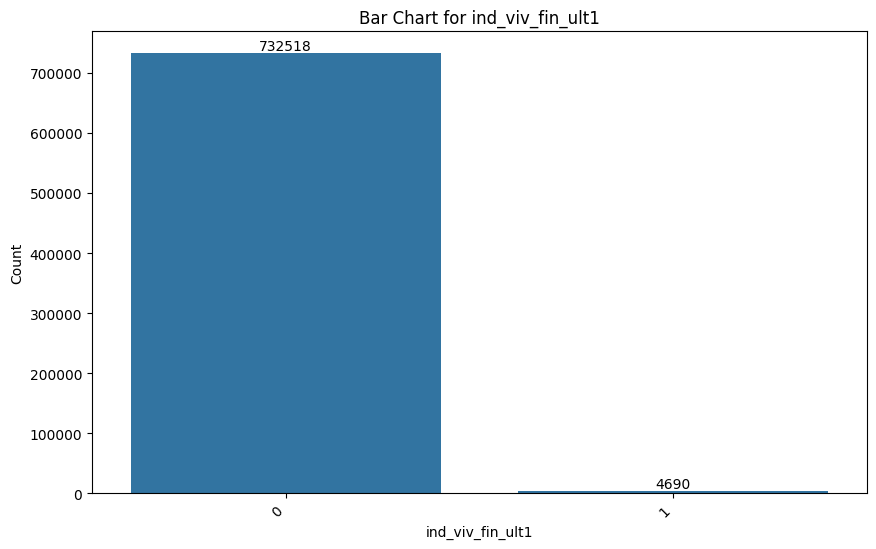

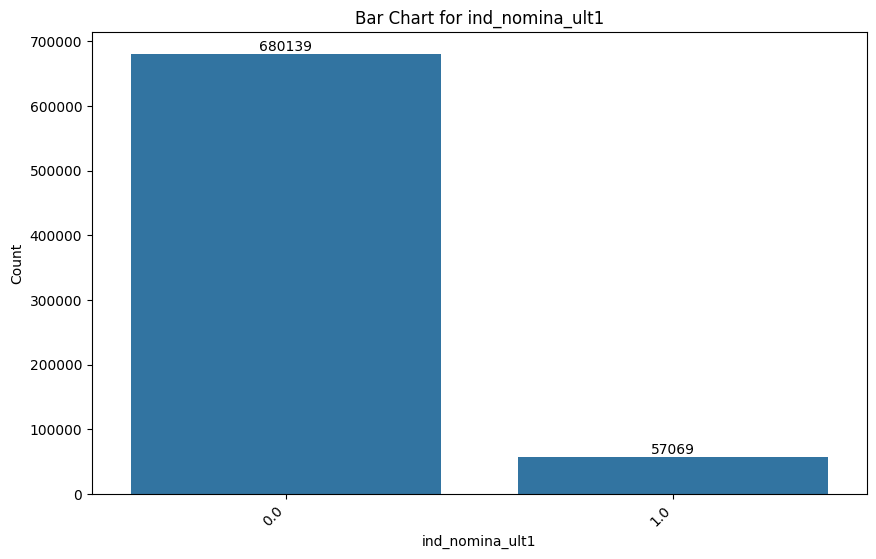

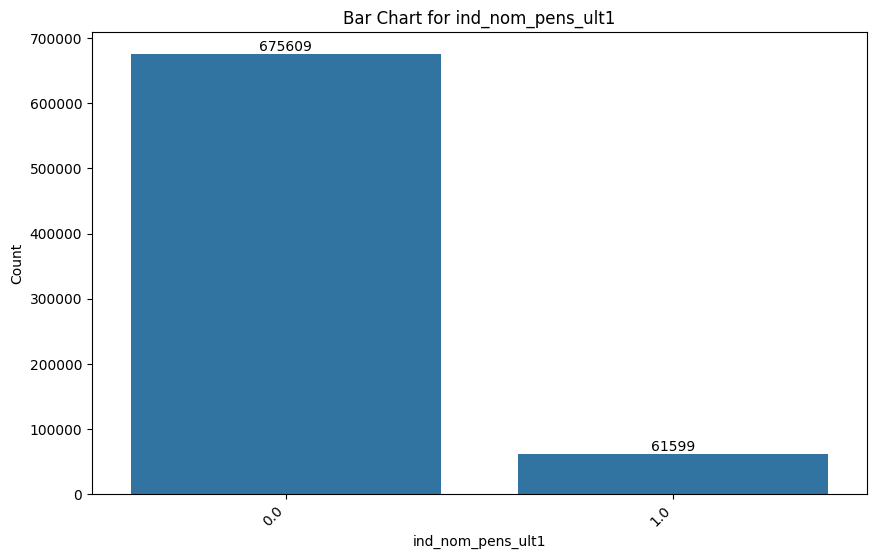

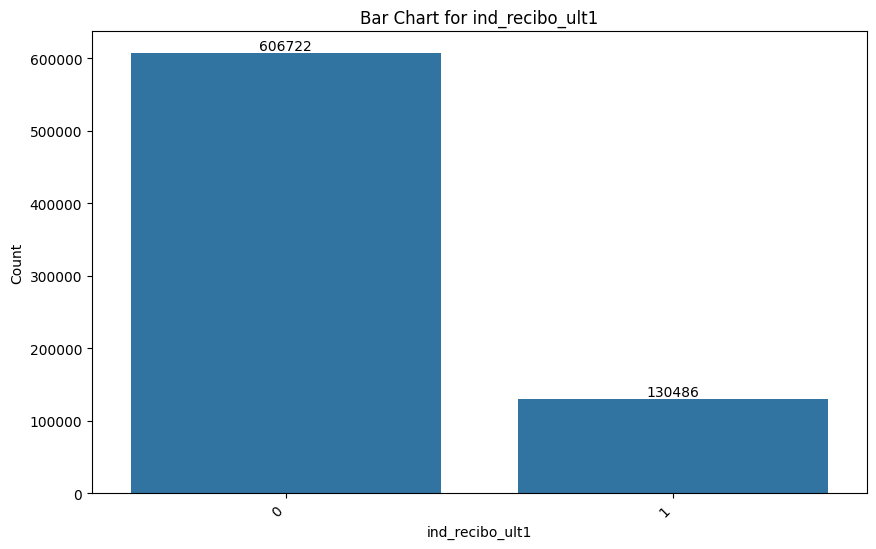

In [26]:
# Looking at frequency of encoded categorical columns

n_class = ['indrel', 'cod_prov', 'ind_actividad_cliente',
       'ind_ahor_fin_ult1', 'ind_aval_fin_ult1', 'ind_cco_fin_ult1',
       'ind_cder_fin_ult1', 'ind_cno_fin_ult1', 'ind_ctju_fin_ult1',
       'ind_ctma_fin_ult1', 'ind_ctop_fin_ult1', 'ind_ctpp_fin_ult1',
       'ind_deco_fin_ult1', 'ind_deme_fin_ult1', 'ind_dela_fin_ult1',
       'ind_ecue_fin_ult1', 'ind_fond_fin_ult1', 'ind_hip_fin_ult1',
       'ind_plan_fin_ult1', 'ind_pres_fin_ult1', 'ind_reca_fin_ult1',
       'ind_tjcr_fin_ult1', 'ind_valo_fin_ult1', 'ind_viv_fin_ult1',
       'ind_nomina_ult1', 'ind_nom_pens_ult1', 'ind_recibo_ult1']

for categorical_column in n_class:

    category_counts = df[categorical_column].value_counts()


    plt.figure(figsize=(10, 6))
    bar_plot = sns.barplot(x=category_counts.index, y=category_counts.values)
    plt.title(f'Bar Chart for {categorical_column}')
    plt.xlabel(categorical_column)
    plt.ylabel('Count')

    # Add text labels on top of the bars
    for index, value in enumerate(category_counts.values):
        plt.text(index, value + 0.1, str(value), ha='center', va='bottom')

    plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
    plt.show()

/tmp/ipykernel_22392/1611412555.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=counts_ones.index, y=counts_ones, palette="viridis")


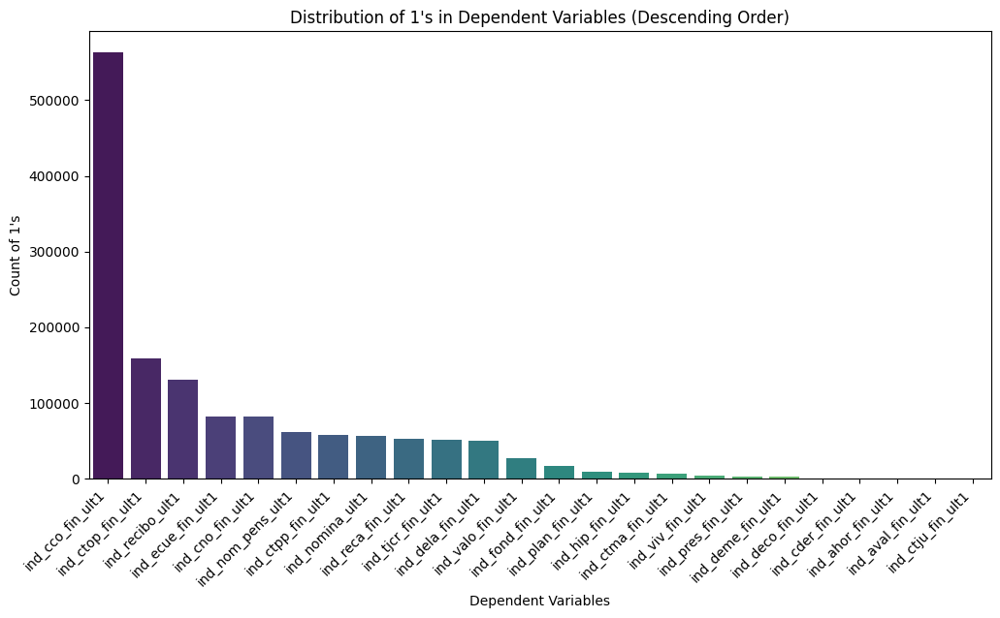

In [27]:
# Checking frequency of target variable

counts_ones = df[target_columns].sum().sort_values(ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(x=counts_ones.index, y=counts_ones, palette="viridis")
plt.title('Distribution of 1\'s in Dependent Variables (Descending Order)')
plt.xlabel('Dependent Variables')
plt.ylabel('Count of 1\'s')
plt.xticks(rotation=45, ha='right')
plt.show()

Text(0.5, 1.0, 'Correlation Matrix Heatmap')

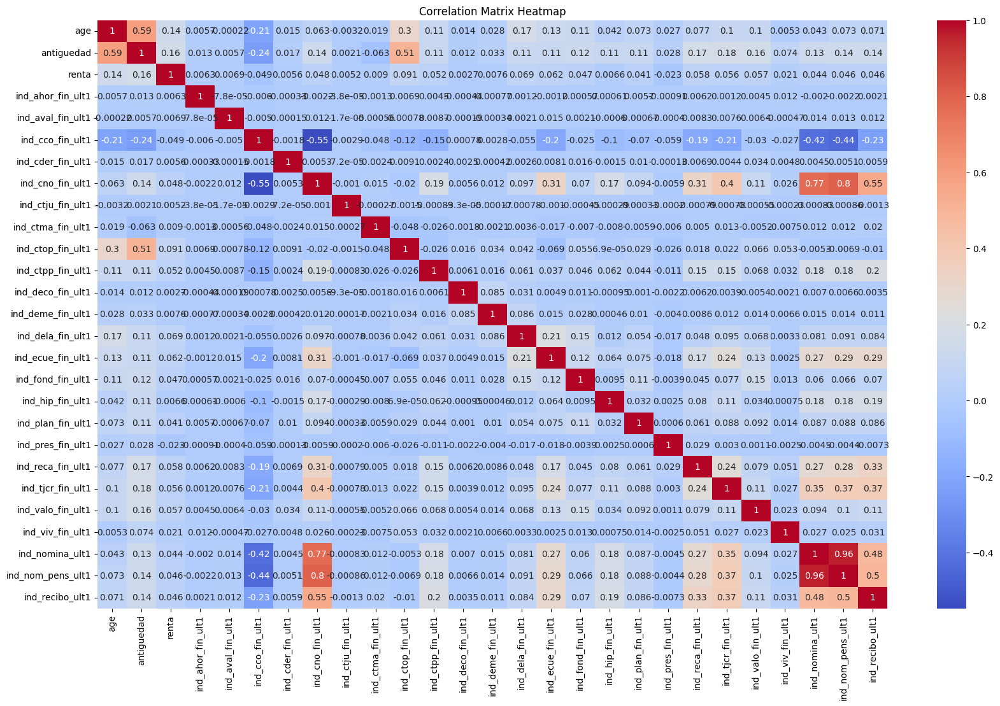

In [28]:
# CORRELATION BETWEEN NUMERICAL AND TARGET VALUES

selected_columns = num_columns + target_columns

subset_df = df[selected_columns]

correlation_matrix = subset_df.corr()

plt.figure(figsize=(20,12))

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix Heatmap')

Text(0.5, 1.0, 'Correlation Matrix Heatmap')

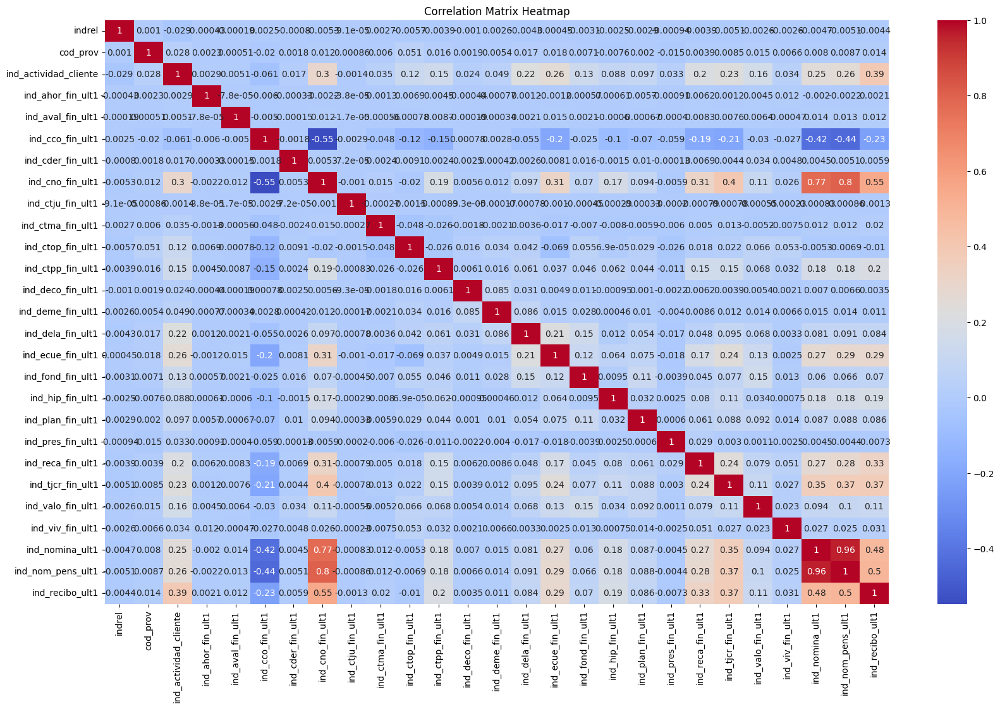

In [29]:
# CORRELATION BETWEEN ENCODED CLASSES AND TARGET VALUES

n_class = ['indrel', 'cod_prov', 'ind_actividad_cliente']

selected_columns = n_class + target_columns

subset_df = df[selected_columns]

correlation_matrix = subset_df.corr()

plt.figure(figsize=(20,12))

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix Heatmap')

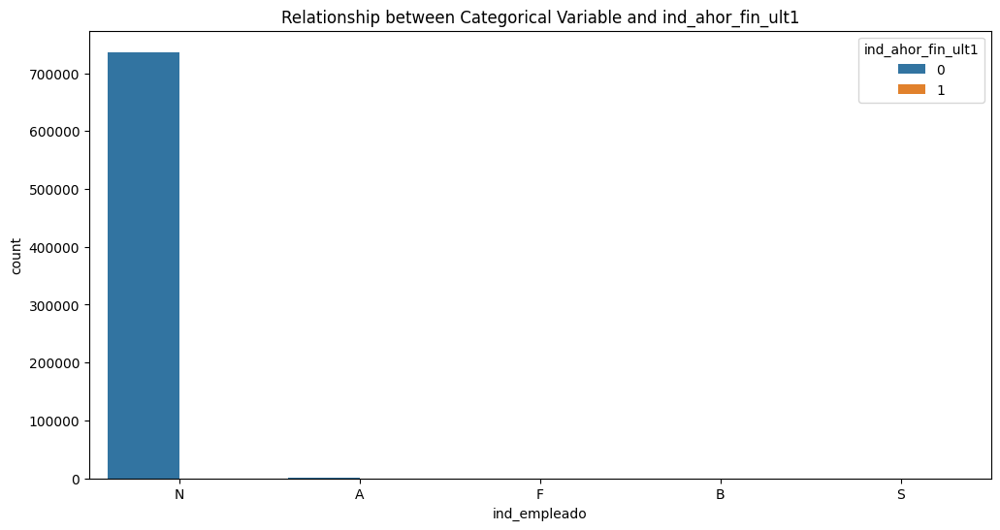

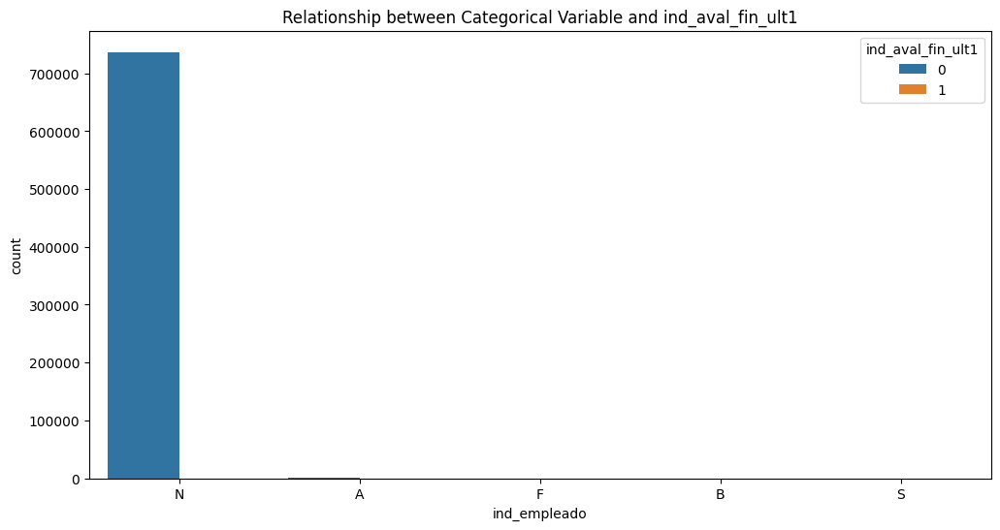

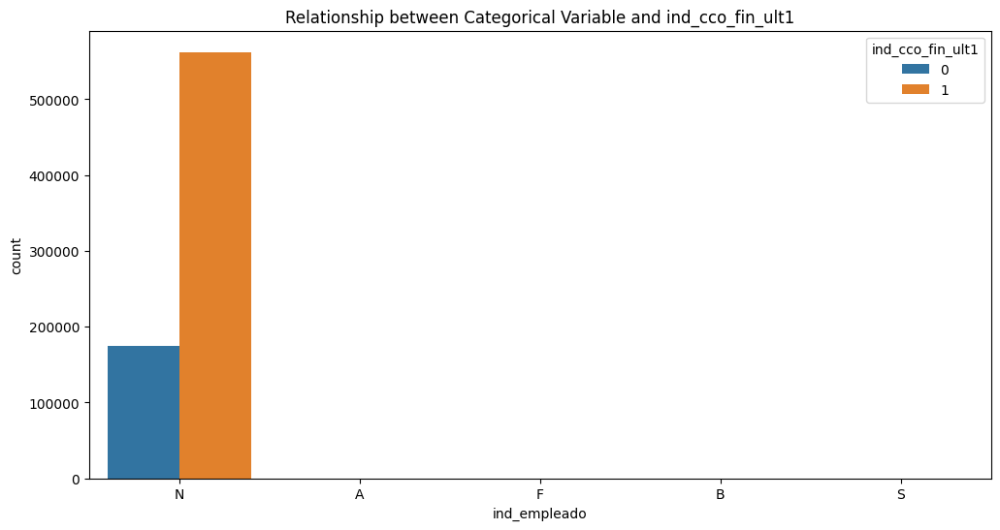

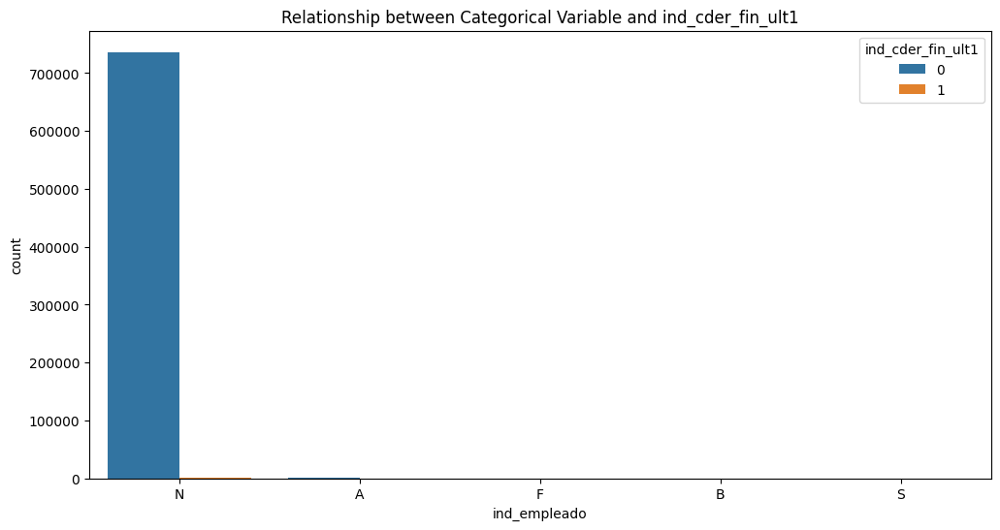

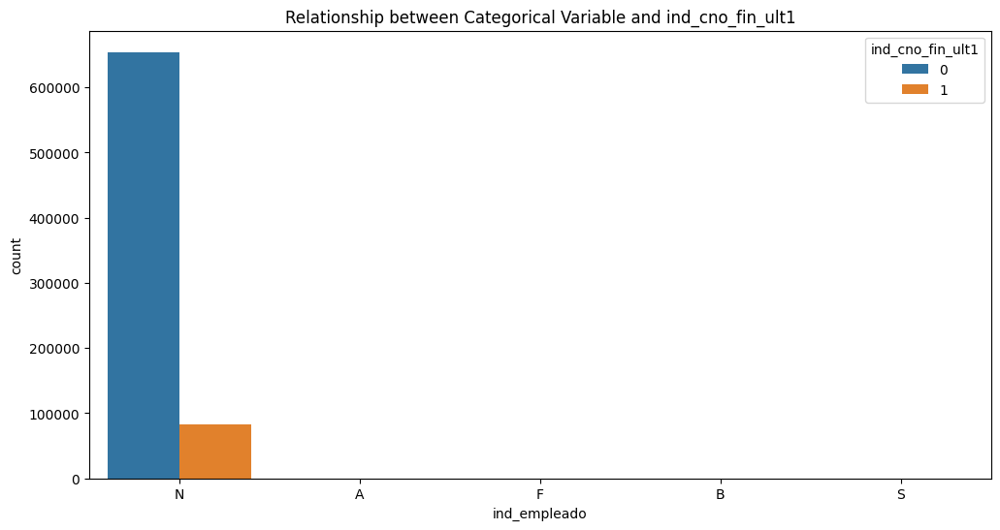

...

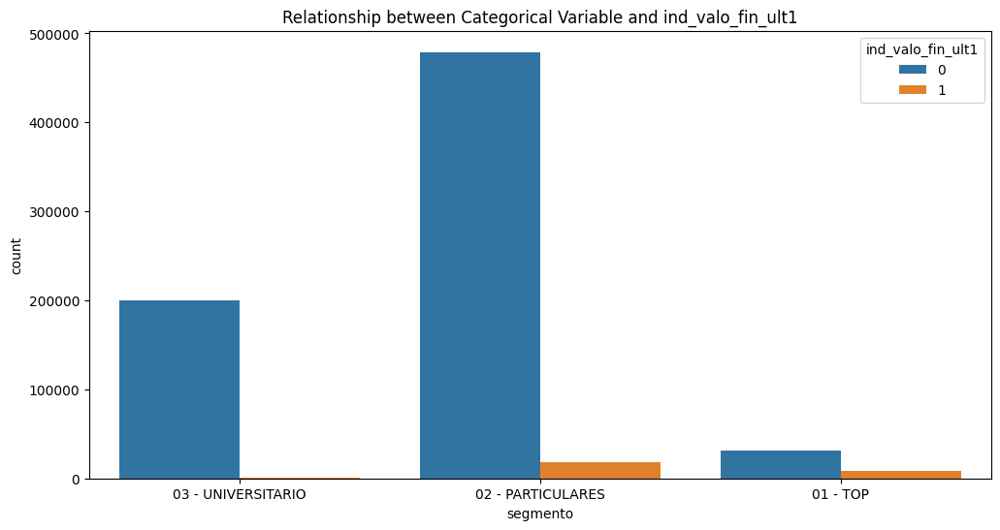

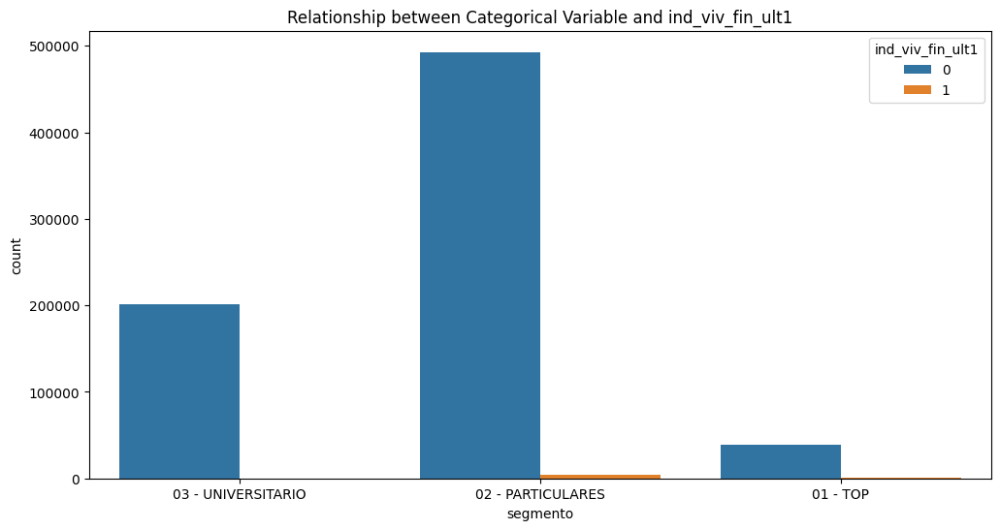

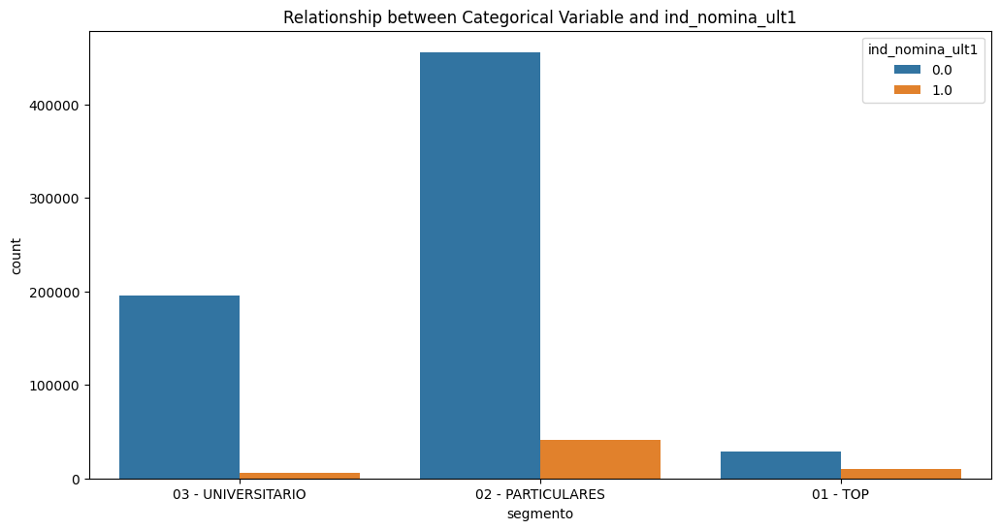

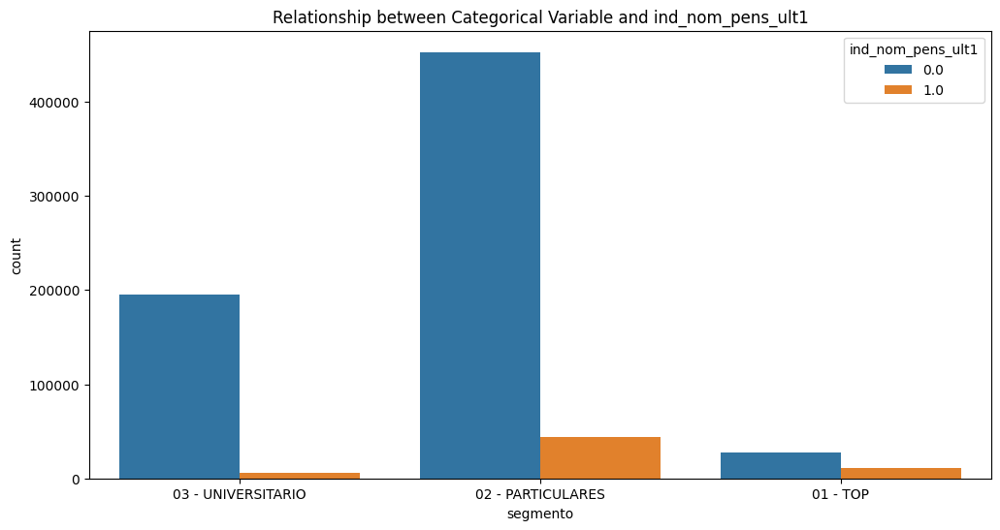

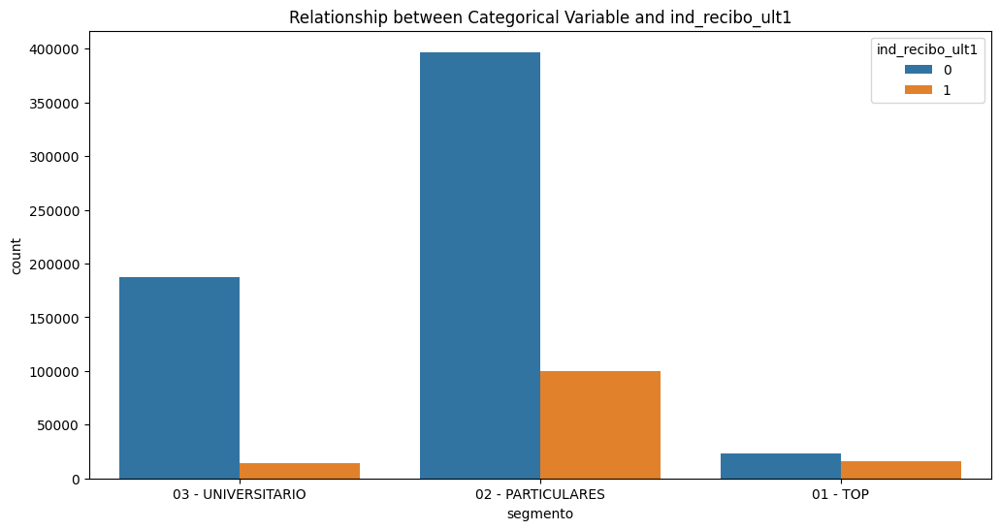

In [30]:
# BARCHARTS OF CATEGORICAL COLUMNS AND TARGET COLUMNS

for col in df.select_dtypes(include='object').columns:

    for target_column in target_columns:
        plt.figure(figsize=(12, 6))
        sns.countplot(x=col, hue=target_column, data=df)
        plt.title(f'Relationship between Categorical Variable and {target_column}')
        plt.show()

Notes:

+ A majority have a primary relationship with bank (indrel), are not employees (ind_empleado), live in Spain (pais_residencia), live in Madrid and Barcelona (nomprov)


+ There are more females than males (sexo), there's a high percentage of inactive customers (ind_actividad_cliente) but still more active customers


+ There's a lot of customers in their low to mid 20s, and in their low to mid 40s.

  
+ A majority DID NOT buy **ind_ahor** (Saving Account), ***ind_aval*** (Guarantees), **ind_cder** (Derivada Account), ***ind_ctju*** (Junior Account), **ind_deco** (Short-term deposits)

  
+ Popular purchases include ***ind_cco*** (Current Accounts), ***ind_ctop*** (Particular Account), ***ind_recibo*** (Direct Debit),(**ind_ecue** (e-account), and **ind_cno** (Payroll Account)


+ ind_cco has higher correlation with multiple independent variables, and a negative correlation with age and antiguedad (seniority in months)

  
+ ind_ctop has correlation of .51 with antiguedad

## Machine Learning

### Problem Formulation 
Going to encode my categorical variables, except for canal_entrada (149 values) and nomprov (52 values).

In [31]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

df['ind_empleado_encoded'] = label_encoder.fit_transform(df['ind_empleado'])
df['pais_residencia_encoded'] = label_encoder.fit_transform(df['pais_residencia'])
df['sexo_encoded'] = label_encoder.fit_transform(df['sexo'])
df['tiprel_1mes_encoded'] = label_encoder.fit_transform(df['tiprel_1mes'])
df['indresi_encoded'] = label_encoder.fit_transform(df['indresi'])
df['indext_encoded'] = label_encoder.fit_transform(df['indext'])
df['indfall_encoded'] = label_encoder.fit_transform(df['indfall'])
df['segmento_encoded'] = label_encoder.fit_transform(df['segmento'])

In [32]:
drop_it = ['ind_empleado','pais_residencia','sexo','tiprel_1mes','indresi',
           'indext', 'indfall', 'segmento']

for i in drop_it:
    df = df.drop(i, axis=1)

df.columns

Index(['fecha_dato', 'age', 'fecha_alta', 'antiguedad', 'indrel',
       'canal_entrada', 'cod_prov', 'nomprov', 'ind_actividad_cliente',
       'renta', 'ind_ahor_fin_ult1', 'ind_aval_fin_ult1', 'ind_cco_fin_ult1',
       'ind_cder_fin_ult1', 'ind_cno_fin_ult1', 'ind_ctju_fin_ult1',
       'ind_ctma_fin_ult1', 'ind_ctop_fin_ult1', 'ind_ctpp_fin_ult1',
       'ind_deco_fin_ult1', 'ind_deme_fin_ult1', 'ind_dela_fin_ult1',
       'ind_ecue_fin_ult1', 'ind_fond_fin_ult1', 'ind_hip_fin_ult1',
       'ind_plan_fin_ult1', 'ind_pres_fin_ult1', 'ind_reca_fin_ult1',
       'ind_tjcr_fin_ult1', 'ind_valo_fin_ult1', 'ind_viv_fin_ult1',
       'ind_nomina_ult1', 'ind_nom_pens_ult1', 'ind_recibo_ult1',
       'ind_empleado_encoded', 'pais_residencia_encoded', 'sexo_encoded',
       'tiprel_1mes_encoded', 'indresi_encoded', 'indext_encoded',
       'indfall_encoded', 'segmento_encoded'],
      dtype='object')

In [33]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

In [34]:
# Taking out our date/time columns, canal_entrada, nomprov
X_columns = ['ind_empleado_encoded', 'pais_residencia_encoded', 'sexo_encoded', 'age',
       'antiguedad', 'indrel', 'tiprel_1mes_encoded', 'indresi_encoded', 'indext_encoded', 
       'indfall_encoded', 'ind_actividad_cliente', 'renta', 'segmento_encoded']

In [35]:
X = df[X_columns]  # First 18 columns - my independent variables (minus date/time)
y = df.iloc[:, 18:]  # Last 24 columns - my target variables

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
from IPython.core.completer import IPCompleter
IPCompleter.timeout = 600

# Initializing the Random Forest Classifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

# Fitting the model on the training data
rf_classifier.fit(X_train, y_train)

# Making predictions on the test data
y_pred = rf_classifier.predict(X_test)

I'm having trouble running this last cell. The kernel keeps dying, will research this.